## Сравнение качества моделей Pion-GAN, EPIC-GAN, iGAPT, MP-GAN

GPU: T4

In [1]:
%pip install -q uproot
%pip install -q awkward-pandas


[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [2]:
%pip install gdown==4.6.1

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [3]:
import torch
from torch import optim, nn
from torch.utils.data import TensorDataset, DataLoader
import os
import gdown
import math
import warnings
import uproot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import numpy as np
from IPython.display import clear_output
from scipy import stats
from scipy.stats import wasserstein_distance
import random
from scipy.interpolate import interp1d
from scipy.integrate import simpson
from torch.nn.utils import clip_grad_norm_, weight_norm, spectral_norm
import copy
import torch.nn.functional as F
import warnings

In [4]:
warnings.filterwarnings("ignore")

In [5]:
N = 2112  # neutron PDG
P = 2212  # proton PDG
pion_masses = {211: 0.13957039, -211: 0.13957039, 111: 0.1349768}  # pions masses
pions = list(pion_masses)  # pions PDG
directions = ["x", "y", "z"]  # momenta components
nucleons = [N, P]
particles = nucleons + pions
label_to_num = {col: i for i, col in enumerate(pions)}  # ordinal encoding for pions PDG
num_to_label = {v: k for k, v in label_to_num.items()}  # ordinal decoding for pions PDG
feat_dim = 3  # generated data dimensionality
seeds = [0xF00D]  # , 0xC0FFEE, 0xDEAD]  # random seeds for experiments (use only one)
part_names = {
    111: r"$\pi_0$",
    -211: r"$\pi^-$",
    211: r"$\pi^+$",
    2112: r"$n$",
    2212: r"$p$",
}

In [6]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True, warn_only=True)


def get_masked_pt(p, pt_min=0.2, pt_max=None, eta_max=1.0):
    px, py, pz = p[..., 0], p[..., 1], p[..., 2]
    pt = torch.sqrt(px**2 + py**2)
    p_total = torch.sqrt(pt**2 + pz**2)
    eta = 0.5 * torch.log((p_total + pz) / (p_total - pz + 1e-10))
    mask = (pt > pt_min) & (torch.abs(eta) < eta_max)
    if pt_max is not None:
        mask = mask & (pt < pt_max)
    return mask, pt


def calc_pt_dist(data, pt_min=0.0, pt_max=1.2, eta_max=10.0):
    pt_list = []
    for event in data:
        mask, pt_event = get_masked_pt(event, pt_min, pt_max, eta_max)
        pt_sel = pt_event[mask]
        pt_list.append(pt_sel)
    return (
        torch.cat(pt_list)
        if pt_list
        else torch.tensor(
            [], device=data.device if isinstance(data, torch.Tensor) else data[0].device
        )
    )


def kl_divergence(real_kde, fake_kde, x, eps=1e-12):
    p = real_kde.evaluate(x)
    q = fake_kde.evaluate(x)
    return simpson(p * np.log((p + eps) / (q + eps)), x)


def w2_distance_1d(real, fake):
    real_sorted = np.sort(real)
    fake_sorted = np.sort(fake)
    if len(real_sorted) != len(fake_sorted):
        q = np.linspace(0, 1, min(len(real_sorted), len(fake_sorted)))
        real_quant = np.quantile(real_sorted, q)
        fake_quant = np.quantile(fake_sorted, q)
        return np.sqrt(np.mean((real_quant - fake_quant) ** 2))
    else:
        return np.sqrt(np.mean((real_sorted - fake_sorted) ** 2))


def calc_energy(px, py, pz, masses):
    return torch.sqrt(px**2 + py**2 + pz**2 + masses**2)


def calc_m_inv(row, mass_number=131):
    energy = np.sum(row["fParticles.fE"])
    px = np.sum(row["fParticles.fPx"])
    py = np.sum(row["fParticles.fPy"])
    pz = np.sum(row["fParticles.fPz"])
    M_inv = np.sqrt(np.maximum(0, energy**2 - (px**2 + py**2 + pz**2)))
    return M_inv / mass_number


def select_particles(row, target_col, mask_cols):
    feature_arr = np.array(row[target_col])
    mask_arr = np.zeros_like(feature_arr)
    for col in mask_cols:
        mask_arr += row[col]
    return feature_arr[mask_arr.astype(bool)]


def calc_pseudorapidity(px=None, py=None, pz=None, eps=1e-5):
    if isinstance(px, torch.Tensor):
        norm = torch.sqrt(px**2 + py**2 + pz**2)
        return 0.5 * torch.log(eps + (norm + pz) / (eps + norm - pz))
    else:
        norm = np.sqrt(px**2 + py**2 + pz**2)
        return 0.5 * np.log(eps + (norm + pz) / (eps + norm - pz))


def calc_pT(px, py):
    return np.sqrt(px**2 + py**2)


def calc_flows(px, py, weights=None):
    phi = np.arctan2(py, px)
    n = len(phi)
    w = np.ones(n) if weights is None else weights
    sum_w = np.sum(w)
    v1 = np.sum(w * np.cos(phi)) / sum_w
    v2 = np.sum(w * np.cos(2 * phi)) / sum_w
    v3 = np.sum(w * np.cos(3 * phi)) / sum_w
    return v1, v2, v3


def get_nucleons_by_type(status, part_type="spectators"):
    if part_type == "spectators":
        return status == 0
    else:
        return status != 0


def get_part_spec(row, target_col, part_type="spectators"):
    nucleon_mask = np.array(row[N]) | np.array(row[P])
    nucleon_indices = np.where(nucleon_mask)[0]
    status = np.array(row["fParticles.fStatus"])[nucleon_indices]
    type_mask = get_nucleons_by_type(status, part_type)
    selected_indices = nucleon_indices[type_mask]
    return np.array(row[target_col])[selected_indices]


def get_final_moms(mom_x, mom_y, mom_z, energy, max_size):
    if mom_x.shape[0] >= max_size:
        mask = np.ones(max_size, dtype=float)
        mom_x = mom_x[:max_size]
        mom_y = mom_y[:max_size]
        mom_z = mom_z[:max_size]
        energy = energy[:max_size]
        mom_merged = np.vstack((mom_x, mom_y, mom_z, energy)).T
    else:
        mask = np.zeros(max_size)
        mask[: len(mom_x)] = 1.0
        zeros_x = np.zeros(max_size)
        zeros_x[: len(mom_x)] = mom_x
        zeros_y = np.zeros(max_size)
        zeros_y[: len(mom_y)] = mom_y
        zeros_z = np.zeros(max_size)
        zeros_z[: len(mom_z)] = mom_z
        zeros_e = np.zeros(max_size)
        zeros_e[: len(energy)] = energy
        mom_merged = np.vstack((zeros_x, zeros_y, zeros_z, zeros_e)).T
    return mom_merged, mask


def preprocess_urqmd(urqmd, max_size_t=80, max_size_c=250, return_cols=False):
    urqmd_new = pd.DataFrame()
    if "fB" in urqmd.columns:
        urqmd_new["B"] = urqmd["fB"]
    urqmd_new["m_inv"] = urqmd.apply(calc_m_inv, axis=1)
    for p in particles:
        urqmd[p] = urqmd["fParticles.fPdg"].apply(lambda x: np.array(x) == p)
    for d in directions:
        urqmd_new[f"mom_{d}"] = urqmd.apply(
            lambda x: select_particles(x, f"fParticles.fP{d}", nucleons), axis=1
        )
        urqmd_new[f"coord_{d}"] = urqmd.apply(
            lambda x: select_particles(x, f"fParticles.f{d.upper()}", nucleons), axis=1
        )
        urqmd_new[f"mom_part_{d}"] = urqmd.apply(
            lambda x: get_part_spec(x, f"fParticles.fP{d}", "participants"), axis=1
        )
        urqmd_new[f"coord_part_{d}"] = urqmd.apply(
            lambda x: get_part_spec(x, f"fParticles.f{d.upper()}", "participants"),
            axis=1,
        )
    urqmd_new["energy_part"] = urqmd.apply(
        lambda x: get_part_spec(x, "fParticles.fE", "participants"), axis=1
    )
    urqmd_new["energy"] = urqmd.apply(
        lambda x: select_particles(x, "fParticles.fE", nucleons), axis=1
    )
    urqmd_new["mom_norm"] = urqmd_new.apply(
        lambda x: np.sqrt(x["mom_x"] ** 2 + x["mom_y"] ** 2 + x["mom_z"] ** 2), axis=1
    )
    urqmd_new["pseudorapidity"] = urqmd_new.apply(
        lambda x: calc_pseudorapidity(px=x["mom_x"], py=x["mom_y"], pz=x["mom_z"]),
        axis=1,
    )
    urqmd_new["pseudorapidity_part"] = urqmd_new.apply(
        lambda x: calc_pseudorapidity(
            px=x["mom_part_x"], py=x["mom_part_y"], pz=x["mom_part_z"]
        ),
        axis=1,
    )
    urqmd_new["mom_T_part"] = urqmd_new.apply(
        lambda x: calc_pT(x["mom_part_x"], x["mom_part_y"]), axis=1
    )
    flows = urqmd_new.apply(
        lambda x: calc_flows(x["mom_part_x"], x["mom_part_y"]),
        axis=1,
        result_type="expand",
    )
    urqmd_new["v1"] = flows[0]
    urqmd_new["v2"] = flows[1]
    urqmd_new["v3"] = flows[2]
    urqmd_new["sum_mom"] = np.sqrt(
        urqmd_new["mom_x"].apply(np.sum) ** 2 + urqmd_new["mom_y"].apply(np.sum) ** 2
    )
    urqmd_new["rms_mom_T"] = np.sqrt(
        urqmd_new["mom_x"].apply(lambda arr: np.mean(arr**2))
        + urqmd_new["mom_y"].apply(lambda arr: np.mean(arr**2))
    )
    urqmd_new["n_p_ratio"] = urqmd.apply(lambda x: np.sum(x[N]) / np.sum(x[P]), axis=1)
    list_cols = [
        "mom_x",
        "mom_y",
        "mom_z",
        "mom_part_x",
        "mom_part_y",
        "mom_part_z",
        "mom_T_part",
        "coord_x",
        "coord_y",
        "coord_z",
        "coord_part_x",
        "coord_part_y",
        "coord_part_z",
        "energy_part",
        "mom_norm",
        "pseudorapidity_part",
        "pseudorapidity",
    ]
    percentiles = [0.5]
    for col in list_cols:
        urqmd_new[f"{col}_mean"] = urqmd_new[col].apply(np.mean)
        urqmd_new[f"{col}_var"] = urqmd_new[col].apply(np.var)
        urqmd_new[f"{col}_kurtosis"] = urqmd_new[col].apply(stats.kurtosis)
        urqmd_new[f"{col}_skew"] = urqmd_new[col].apply(stats.skew)
        for p in percentiles:
            urqmd_new[f"{col}_{p}_perc"] = urqmd_new[col].apply(
                lambda x: np.percentile(x, p)
            )
    for col in ["psi1", "psi2", "mom_T", "phi"]:
        if col in urqmd_new.columns:
            urqmd_new.drop(columns=col, inplace=True)
    cond_cols = ["B"]
    urqmd[cond_cols] = urqmd_new[cond_cols]
    for p in particles:
        for d in directions:
            urqmd[f"{p}_mom_{d}"] = urqmd.apply(
                lambda x: select_particles(x, f"fParticles.fP{d}", [p]), axis=1
            )
        urqmd[f"{p}_energy"] = urqmd.apply(
            lambda x: select_particles(x, "fParticles.fE", [p]), axis=1
        )
    nucleons_cols = [f"{c}_moms" for c in nucleons if c != "nuclei"]
    nucleons_mask_cols = [f"{c}_mask" for c in nucleons if c != "nuclei"]
    df_rows = []
    for i, row in urqmd.iterrows():
        base_cond = {k: row[k] for k in cond_cols}
        for pion in pions:
            cond = base_cond.copy()
            cond["label"] = label_to_num[pion]
            cond["event"] = i
            mom_x = row[f"{pion}_mom_x"]
            mom_y = row[f"{pion}_mom_y"]
            mom_z = row[f"{pion}_mom_z"]
            energy = row[f"{pion}_energy"]
            for bc in nucleons:
                if bc == "nuclei":
                    continue
                baryon_mom_merged, baryon_mask = get_final_moms(
                    row[f"{bc}_mom_x"],
                    row[f"{bc}_mom_y"],
                    row[f"{bc}_mom_z"],
                    row[f"{bc}_energy"],
                    max_size_c,
                )
                cond[f"{bc}_moms"] = baryon_mom_merged
                cond[f"{bc}_mask"] = baryon_mask
            cond["nucleons_moms"] = np.concatenate(
                [cond["2112_moms"], cond["2212_moms"]], axis=0
            )
            cond["nucleons_mask"] = np.concatenate(
                [cond["2112_mask"], cond["2212_mask"]], axis=0
            )
            target_mom_merged, target_mask = get_final_moms(
                mom_x, mom_y, mom_z, energy, max_size_t
            )
            if target_mask.sum() == 0:
                continue
            cond["target_moms"] = target_mom_merged
            cond["target_mask"] = target_mask
            df_rows.append(cond)
    df = pd.DataFrame(df_rows)
    if return_cols:
        return df, cond_cols, ["nucleons_moms"], ["nucleons_mask"]
    return df

In [7]:
def plot_losses(losses):
    clear_output()
    len_ = len(losses.keys())
    fig, ax = plt.subplots(nrows=1, ncols=len_, figsize=(3 * len_, 3))
    for j, k in enumerate(losses.keys()):
        ax[j].plot([i + 1 for i in range(len(losses[k]))], losses[k])
        ax[j].set_title(k)
    plt.tight_layout()
    plt.show()


def plot_kde(real, fake, dim_names, part_type, num=None, show_plots=True):
    fig, axes = plt.subplots(2, 5, figsize=(25, 9))
    if num is not None:
        p_sq = real[..., 0] ** 2 + real[..., 1] ** 2 + real[..., 2] ** 2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(real.shape[0])
        real = real[batch_idx, kth_idx]
        p_sq = fake[..., 0] ** 2 + fake[..., 1] ** 2 + fake[..., 2] ** 2
        sorted_indices = torch.argsort(p_sq, dim=1, descending=True)
        kth_idx = sorted_indices[:, num]
        batch_idx = np.arange(fake.shape[0])
        fake = fake[batch_idx, kth_idx]
    else:
        real = real.reshape(-1, real.shape[-1])
        fake = fake.reshape(-1, fake.shape[-1])
    real = real[~torch.all(real == 0.0, dim=1)]
    fake = fake[~torch.all(fake == 0.0, dim=1)]
    masses = torch.full_like(fake[..., -1], pion_masses[part_type])
    real_energy = real[..., -1]
    fake_energy = calc_energy(fake[..., 0], fake[..., 1], fake[..., 2], masses)
    real_eta = calc_pseudorapidity(real[..., 0], real[..., 1], real[..., 2])
    fake_eta = calc_pseudorapidity(fake[..., 0], fake[..., 1], fake[..., 2])
    metrics = {}
    for i in range(5):
        if i < 3:
            real_vals = real[:, i].numpy()
            fake_vals = fake[:, i].numpy()
            title_pre = f"{part_names[part_type]} ({dim_names[i]},"
            axes[0, i].set_xlabel(f"$p_{dim_names[i]}$")
            axes[1, i].set_xlabel(f"$p_{dim_names[i]}$")
        elif i == 3:
            real_vals = real_energy.numpy()
            fake_vals = fake_energy.numpy()
            title_pre = f"{part_names[part_type]} (" + r"$E$" + ", "
            axes[0, i].set_xlabel(r"$E$")
            axes[1, i].set_xlabel(r"$E$")
        else:
            real_vals = real_eta.numpy()
            fake_vals = fake_eta.numpy()
            title_pre = f"{part_names[part_type]} (" + r"$\eta$" + ", "
            axes[0, i].set_xlabel(r"$\eta$")
            axes[1, i].set_xlabel(r"$\eta$")
        kde_real = stats.gaussian_kde(real_vals, bw_method="scott")
        kde_fake = stats.gaussian_kde(fake_vals, bw_method="scott")
        x_points = np.linspace(
            min(real_vals.min(), fake_vals.min()),
            max(real_vals.max(), fake_vals.max()),
            1000,
        )
        pdf_real = kde_real(x_points)
        pdf_fake = kde_fake(x_points)
        kl = kl_divergence(kde_real, kde_fake, x_points)
        w1 = wasserstein_distance(real_vals, fake_vals)
        w2 = w2_distance_1d(real_vals, fake_vals)
        if i == 3:
            metrics["e_kl"] = kl
            metrics["e_w1"] = w1
        elif i > 3:
            metrics["eta_kl"] = kl
            metrics["eta_w1"] = w1
        axes[0, i].plot(x_points, pdf_real, label="UrQMD", color="tab:blue")
        axes[0, i].plot(x_points, pdf_fake, label="GAN", color="tab:red")
        axes[0, i].set_title(
            f'{title_pre} {"все частицы" if num is None else r"$p_{max}$" if num == 0 else num})\nKL={kl:.3f} W1={w1:.3f} W2={w2:.3f}'
        )
        axes[0, i].legend()
        axes[0, i].grid(True, alpha=0.3)
        axes[1, i].hist(real_vals, bins=50, alpha=0.5, color="tab:blue", label="UrQMD")
        axes[1, i].hist(
            fake_vals, bins=50, histtype="step", color="tab:red", label="GAN"
        )
        axes[1, i].set_title(
            f'{title_pre} {"все частицы" if num is None else r"$p_{max}$" if num == 0 else num})'
        )
        axes[1, i].legend()
        axes[1, i].grid(True, alpha=0.3)
    if show_plots:
        plt.tight_layout()
        plt.show()
    else:
        plt.close()
    return metrics


def plot_scatter(real, fake):
    fig = plt.figure(figsize=(12, 5))
    ax1 = fig.add_subplot(121, projection="3d")
    real_flat = real.reshape(-1, real.shape[-1])
    fake_flat = fake.reshape(-1, fake.shape[-1])
    real_flat = real_flat[~torch.all(real_flat == 0.0, dim=1)]
    fake_flat = fake_flat[~torch.all(fake_flat == 0.0, dim=1)]
    ax1.scatter(
        real_flat[:, 0],
        real_flat[:, 1],
        real_flat[:, 2],
        alpha=0.6,
    )
    ax1.set_xlim(-2, 2)
    ax1.set_xlabel(r"$p_x$", fontsize=14, labelpad=10)
    ax1.set_ylim(-2, 2)
    ax1.set_ylabel(r"$p_y$", fontsize=14, labelpad=10)
    ax1.set_zlim(-2, 2)
    ax1.set_zlabel(r"$p_z$", fontsize=14, labelpad=10)
    ax1.set_title("UrQMD")
    ax2 = fig.add_subplot(122, projection="3d")
    ax2.scatter(
        fake_flat[:, 0],
        fake_flat[:, 1],
        fake_flat[:, 2],
        alpha=0.6,
        color="orange",
    )
    ax2.set_xlim(-2, 2)
    ax2.set_xlabel(r"$p_x$", fontsize=14, labelpad=10)
    ax2.set_ylim(-2, 2)
    ax2.set_ylabel(r"$p_y$", fontsize=14, labelpad=10)
    ax2.set_zlim(-2, 2)
    ax2.set_zlabel(r"$p_z$", fontsize=14, labelpad=10)
    ax2.set_title("GAN")
    plt.show()


def calc_vn_vs_pt(
    data, pt_min, pt_max, eta_max, nbins, n, min_particles=15, n_interp=200
):
    pt_all, phi_all = [], []
    for event in data:
        if isinstance(event, torch.Tensor):
            event = event.cpu().numpy()
        px = event[..., 0]
        py = event[..., 1]
        pz = event[..., 2]
        pt = np.sqrt(px**2 + py**2)
        p_total = np.sqrt(pt**2 + pz**2)
        eta = 0.5 * np.log((p_total + pz) / (p_total - pz + 1e-10))
        mask = (pt > pt_min) & (pt < pt_max) & (np.abs(eta) < eta_max)
        pt_all.extend(pt[mask])
        phi_all.extend(np.arctan2(py[mask], px[mask]))
    pt_all = np.array(pt_all)
    phi_all = np.array(phi_all)
    bin_edges = np.linspace(pt_min, pt_max, nbins + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    vn_vals = np.full(nbins, np.nan)
    err_vals = np.full(nbins, np.nan)
    for i in range(nbins):
        mask_bin = (pt_all >= bin_edges[i]) & (pt_all < bin_edges[i + 1])
        count = np.sum(mask_bin)
        if count >= min_particles:
            cos_nphi = np.cos(n * phi_all[mask_bin])
            vn_vals[i] = np.mean(cos_nphi)
            err_vals[i] = np.std(cos_nphi) / np.sqrt(count)
    p_interp = np.linspace(pt_min, pt_max, n_interp)
    valid = ~np.isnan(vn_vals)
    if np.sum(valid) < 2:
        vn_interp = np.zeros_like(p_interp)
        err_interp = np.full_like(p_interp, 1.0)
        is_interp = np.ones_like(p_interp, dtype=bool)
        return p_interp, vn_interp, err_interp, is_interp
    f_vn = interp1d(
        bin_centers[valid],
        vn_vals[valid],
        kind="linear",
        fill_value="extrapolate",
        bounds_error=False,
    )
    f_err = interp1d(
        bin_centers[valid],
        err_vals[valid],
        kind="linear",
        fill_value="extrapolate",
        bounds_error=False,
    )
    vn_interp = f_vn(p_interp)
    err_interp = f_err(p_interp)
    bin_width = bin_edges[1] - bin_edges[0]
    is_interp = np.ones_like(p_interp, dtype=bool)
    for j, p_j in enumerate(p_interp):
        dist = np.min(np.abs(bin_centers[valid] - p_j))
        if dist <= bin_width * 0.6:
            is_interp[j] = False
    mean_err = np.nanmean(err_vals[valid])
    err_interp[is_interp] = np.maximum(err_interp[is_interp], 2.0 * mean_err)
    return p_interp, vn_interp, err_interp, is_interp


def plot_vn(
    real_data,
    fake_data,
    pt_min=0.0,
    pt_max=1.2,
    eta_max=10.0,
    nbins=10,
    pt_bins=50,
    min_particles=15,
    n_interp=200,
):
    metrics = {}
    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16, 10))
    harmonics = [1, 2, 3]
    for idx, n in enumerate(harmonics):
        row = int(idx == 2)
        col = idx % 2
        real_p, real_vn, real_err, real_is_interp = calc_vn_vs_pt(
            real_data,
            pt_min,
            pt_max,
            eta_max,
            nbins,
            n,
            min_particles=min_particles,
            n_interp=n_interp,
        )
        fake_p, fake_vn, fake_err, fake_is_interp = calc_vn_vs_pt(
            fake_data,
            pt_min,
            pt_max,
            eta_max,
            nbins,
            n,
            min_particles=min_particles,
            n_interp=n_interp,
        )
        metrics[f"v{n}"] = np.nanmean((real_vn - fake_vn) ** 2)
        mask_real_meas = ~real_is_interp
        ax[row][col].plot(
            real_p[mask_real_meas],
            real_vn[mask_real_meas],
            color="C0",
            linewidth=2,
            label="UrQMD (измер.)",
        )
        ax[row][col].fill_between(
            real_p, real_vn - real_err, real_vn + real_err, alpha=0.2, color="C0"
        )
        mask_real_interp = real_is_interp
        if np.any(mask_real_interp):
            ax[row][col].plot(
                real_p[mask_real_interp],
                real_vn[mask_real_interp],
                "--",
                color="C0",
                linewidth=1,
                alpha=0.5,
                label="UrQMD (интерп.)" if idx == 0 else "",
            )
        mask_fake_meas = ~fake_is_interp
        ax[row][col].plot(
            fake_p[mask_fake_meas],
            fake_vn[mask_fake_meas],
            color="C3",
            linewidth=2,
            label="GAN (измер.)",
        )
        ax[row][col].fill_between(
            fake_p, fake_vn - fake_err, fake_vn + fake_err, alpha=0.2, color="C3"
        )
        mask_fake_interp = fake_is_interp
        if np.any(mask_fake_interp):
            ax[row][col].plot(
                fake_p[mask_fake_interp],
                fake_vn[mask_fake_interp],
                "--",
                color="C3",
                linewidth=1,
                alpha=0.5,
                label="GAN (интерп.)" if idx == 0 else "",
            )
        ax[row][col].set_xlabel(r"$p_T$ (GeV/c)", fontsize=12)
        ax[row][col].set_ylabel(f"$v_{{{n}}}$", fontsize=12)
        ax[row][col].legend(fontsize=9)
        ax[row][col].grid(alpha=0.3)
        ax[row][col].set_title(f"$v_{{{n}}}(p_T)$", fontsize=13)
    pt_real_all = calc_pt_dist(real_data)
    pt_fake_all = calc_pt_dist(fake_data)
    ax[1][1].hist(
        pt_real_all.numpy(),
        bins=pt_bins,
        density=True,
        alpha=0.5,
        label="UrQMD",
        color="C0",
    )
    ax[1][1].hist(
        pt_fake_all.numpy(),
        bins=pt_bins,
        density=True,
        alpha=0.5,
        label="GAN",
        color="C3",
    )
    ax[1][1].set_xlabel(r"$p_T$ (GeV/c)", fontsize=12)
    ax[1][1].set_ylabel("Нормированное число частиц", fontsize=12)
    ax[1][1].set_title("Распределение по $p_T$", fontsize=13)
    ax[1][1].legend()
    ax[1][1].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    return metrics


def plot_pt(real, fake, mode="pt"):
    real_keys = [
        part_names[k] if k in part_names.keys() else str(k) for k in real.keys()
    ]
    real_values = [np.mean(v) for v in real.values()]
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(real_keys, real_values, label="UrQMD", alpha=0.5)
    fake_keys = [
        part_names[k] if k in part_names.keys() else str(k) for k in fake.keys()
    ]
    fake_values = [np.mean(v) for v in fake.values()]
    bars = ax.bar(fake_keys, fake_values, label="GAN", alpha=0.5)
    real_values = np.array(real_values)
    fake_values = np.array(fake_values)
    ratios = [
        round(val, 2) for val in (np.abs(real_values - fake_values) / real_values * 100)
    ]
    str_ratios = [f"{val}%" for val in ratios]
    ax.bar_label(bars, labels=str_ratios, padding=3)
    ax.set_xlabel("particle type")
    ax.set_ylabel("value")
    ax.set_title(
        "Доля поперечного импульса в событии"
        if mode == "pt"
        else "Доля полной энергии в событии"
    )
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.legend()
    plt.show()
    return np.mean(ratios)

In [8]:
def generate_transformer(G, batch_size, n_points, cond, labels, device, threshold=0.5):
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    with torch.no_grad():
        impulses, mask_probs = G(labels, cond)
    mask = (mask_probs >= threshold).float()
    impulses = impulses * mask.unsqueeze(-1)
    return impulses.cpu()


def generate_epic_mask(batch_size, n_points, labels, counts):
    labels_arr = labels.detach().cpu().view(-1)
    mask = torch.zeros(batch_size, n_points, dtype=torch.int32)
    for i in range(batch_size):
        lbl = labels_arr[i].item()
        params = counts[num_to_label[lbl]]
        mean = params["mean"]
        std = params["std"]
        num = np.random.normal(mean, std)
        num = int(round(num))
        num = max(1, min(num, n_points))
        indices = np.random.choice(n_points, size=num, replace=False)
        mask[i, indices] = 1
    return mask


def generate_epic(
    G, batch_size, n_points, cond, labels, device, counts, zg_dim, zl_dim
):
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    z_global = torch.randn(batch_size, zg_dim, device=device)
    z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
    mask = generate_epic_mask(batch_size, n_points, labels, counts)
    with torch.no_grad():
        impulses = G(z_global, z_local, cond, labels)
    return impulses.cpu() * mask.unsqueeze(-1)


def generate_gapt(G, batch_size, n_points, cond, labels, device):
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    with torch.no_grad():
        impulses = G(cond, labels)
    return impulses.cpu()


def generate_mp(G, batch_size, n_points, cond, labels, device):
    G.eval()
    cond = cond.to(device)
    labels = labels.to(device)
    with torch.no_grad():
        impulses = G(cond, labels)
    return impulses.cpu()


def count_pt(particles):
    pt_parts = {}
    sum_pt = 0
    for k, v in particles.items():
        pt = torch.sum(torch.sqrt(v[..., 0] ** 2 + v[..., 1] ** 2))
        sum_pt += pt
        pt_parts[k] = pt
    pt_parts = {k: (v / sum_pt).item() for k, v in pt_parts.items()}
    return pt_parts


def count_e(particles):
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        e = torch.sum(v[..., -1])
        sum_e += e
        e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def count_e_with_mass(particles):
    e_parts = {}
    sum_e = 0
    for k, v in particles.items():
        if k == "нуклоны":
            e = torch.sum(v[..., -1])
            sum_e += e
            e_parts[k] = e
        else:
            e = torch.sum(
                calc_energy(
                    v[..., 0],
                    v[..., 1],
                    v[..., 2],
                    torch.full_like(v[:, 0], pion_masses[k]),
                )
            )
            sum_e += e
            e_parts[k] = e
    e_parts = {k: (v / sum_e).item() for k, v in e_parts.items()}
    return e_parts


def get_dist_metrics(
    G,
    generate_func,
    n_points,
    test_mom,
    test_cond,
    test_label,
    test_mask,
    device,
    **kwargs
):
    metrics = {}
    for i in range(len(num_to_label)):
        metrics[num_to_label[i]] = {}
        mask = torch.tensor(test_label) == i
        if mask.sum() == 0:
            continue
        other_test = torch.tensor(test_mom, dtype=torch.float32)[mask]
        label_test = torch.tensor(test_label)[mask]
        mask_test = torch.tensor(test_mask, dtype=torch.float32)[mask]
        cond_test = torch.tensor(test_cond, dtype=torch.float32)[mask]
        generated_other = generate_func(
            G, mask.sum(), n_points, cond_test, label_test, device, **kwargs
        )
        m = plot_kde(other_test, generated_other, ["Px", "Py", "Pz"], num_to_label[i])
        metrics[num_to_label[i]]["e_kl"] = m["e_kl"]
        metrics[num_to_label[i]]["e_w1"] = m["e_w1"]
        metrics[num_to_label[i]]["eta_kl"] = m["eta_kl"]
        metrics[num_to_label[i]]["eta_w1"] = m["eta_w1"]
        m_0 = plot_kde(
            other_test,
            generated_other,
            ["Px", "Py", "Pz"],
            num_to_label[i],
            num=0,
            show_plots=False,
        )
        metrics[num_to_label[i]]["e_kl_0"] = m_0["e_kl"]
        metrics[num_to_label[i]]["e_w1_0"] = m_0["e_w1"]
        metrics[num_to_label[i]]["eta_kl_0"] = m_0["eta_kl"]
        metrics[num_to_label[i]]["eta_w1_0"] = m_0["eta_w1"]
        plot_kde(
            other_test,
            generated_other,
            ["Px", "Py", "Pz"],
            num_to_label[i],
            num=1,
            show_plots=False,
        )
        plot_kde(
            other_test,
            generated_other,
            ["Px", "Py", "Pz"],
            num_to_label[i],
            num=2,
            show_plots=False,
        )
        plot_scatter(other_test, generated_other)
        vn_metrics = plot_vn(other_test, generated_other)
        for k, v in vn_metrics.items():
            metrics[num_to_label[i]][k] = v
    return metrics


def get_energy_metrics(
    G,
    generate_func,
    n_points,
    test_mom,
    test_nucl,
    test_nucl_mask,
    test_event,
    test_cond,
    test_label,
    test_mask,
    device,
    **kwargs
):
    all_real_pt = {}
    all_fake_pt = {}
    all_real_e = {}
    all_fake_e = {}
    for i in np.unique(test_event):
        mask = torch.tensor(test_event) == i
        if mask.sum() == 0:
            continue
        other_test = torch.tensor(test_mom, dtype=torch.float32)[mask]
        real = {}
        fake = {}
        real["нуклоны"] = torch.tensor(test_nucl, dtype=torch.float32)[mask][0]
        fake["нуклоны"] = torch.tensor(test_nucl, dtype=torch.float32)[mask][0]
        label_test = torch.tensor(test_label)[mask]
        mask_test = torch.tensor(test_mask, dtype=torch.float32)[mask]
        cond_test = torch.tensor(test_cond, dtype=torch.float32)[mask]
        generated_other = generate_func(
            G, mask.sum(), n_points, cond_test, label_test, device, **kwargs
        )
        for i in range(len(label_test)):
            real[num_to_label[label_test[i].item()]] = other_test[i]
            fake[num_to_label[label_test[i].item()]] = generated_other[i]
        real_pt = count_pt(real)
        fake_pt = count_pt(fake)
        real_e = count_e(real)
        fake_e = count_e_with_mass(fake)
        for k in real_pt.keys():
            if k in all_real_pt:
                all_real_pt[k].append(real_pt[k])
                all_fake_pt[k].append(fake_pt[k])
                all_real_e[k].append(real_e[k])
                all_fake_e[k].append(fake_e[k])
            else:
                all_real_pt[k] = [real_pt[k]]
                all_fake_pt[k] = [fake_pt[k]]
                all_real_e[k] = [real_e[k]]
                all_fake_e[k] = [fake_e[k]]
    metrics = {}
    pt_ = plot_pt(all_real_pt, all_fake_pt)
    e_ = plot_pt(all_real_e, all_fake_e, mode="energy")
    for p in pions:
        metrics[p] = {}
        metrics[p]["pt"] = pt_
        metrics[p]["e"] = e_
    return metrics

In [9]:
def compute_gradient_penalty(
    discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake
):
    batch_size = real_data.size(0)
    epsilon = torch.rand(batch_size, 1, 1, device=real_data.device)
    interpolated = epsilon * real_data + (1 - epsilon) * fake_data
    interpolated.requires_grad_(True)
    combined_mask = (mask_real.bool() | mask_fake.bool()).float()
    d_interpolated = discriminator(interpolated, labels, cond, combined_mask)
    grad = torch.autograd.grad(
        outputs=d_interpolated,
        inputs=interpolated,
        grad_outputs=torch.ones_like(d_interpolated),
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    grad = grad * combined_mask.unsqueeze(-1)
    grad = grad.view(batch_size, -1)
    grad_norm = grad.norm(2, dim=1)
    gp = ((grad_norm - 1) ** 2).mean()
    return gp


def wgan_gp_loss(
    d_real,
    d_fake,
    real_data,
    fake_data,
    discriminator,
    cond,
    labels,
    mask_real,
    mask_fake,
    lambda_gp=10,
):
    gp = compute_gradient_penalty(
        discriminator, real_data, fake_data, cond, labels, mask_real, mask_fake
    )
    d_loss = d_fake.mean() - d_real.mean() + lambda_gp * gp
    g_loss = -d_fake.mean()
    return d_loss, g_loss


def update_average(model_tgt, model_src, beta):
    with torch.no_grad():
        params_src = dict(model_src.named_parameters())
        params_tgt = dict(model_tgt.named_parameters())
        for k in params_src.keys():
            params_tgt[k].data.copy_(
                torch.lerp(params_tgt[k].data, params_src[k].data, 1.0 - beta)
            )


def train_epoch_transformer(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    lambda_mask=1.0,
    lambda_len=1.0,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
):
    G.train()
    D.train()
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    epoch_mask_loss = 0.0
    epoch_len_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :-1].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        mask = mask.to(device)
        batch_size, max_len, feats = real_impulses.shape
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, labels, cond, mask)
            with torch.no_grad():
                fake_impulses, fake_mask = G(labels, cond)
            d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
            if mode == "lsgan":
                d_real_mse = F.mse_loss(d_real, torch.ones(batch_size, device=device))
                d_fake_mse = F.mse_loss(d_fake, torch.zeros(batch_size, device=device))
                d_loss = (d_real_mse + d_fake_mse) / 2
            else:
                d_loss, _ = wgan_gp_loss(
                    d_real,
                    d_fake,
                    real_impulses,
                    fake_impulses,
                    D,
                    cond,
                    labels,
                    mask,
                    fake_mask,
                )
            d_loss.backward()
            nn.utils.clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        fake_impulses, fake_mask = G(labels, cond)
        d_fake = D(fake_impulses * fake_mask.unsqueeze(-1), labels, cond, fake_mask)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones(batch_size, device=device))
        else:
            g_loss = -d_fake.mean()
        mask_loss = F.binary_cross_entropy(fake_mask, mask)
        real_len = mask.sum(dim=1)
        fake_len = fake_mask.sum(dim=1)
        len_loss = F.mse_loss(fake_len, real_len)
        total_g_loss = g_loss + lambda_mask * mask_loss + lambda_len * len_loss
        total_g_loss.backward()
        nn.utils.clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        epoch_mask_loss += mask_loss.item()
        epoch_len_loss += len_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {
        "d_loss": epoch_d_loss / num_batches,
        "g_loss": epoch_g_loss / num_batches,
        "mask_loss": epoch_mask_loss / num_batches,
        "len_loss": epoch_len_loss / num_batches,
    }


def train_epoch_epic(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    zg_dim=128,
    zl_dim=16,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
    counts=None,
):
    G.train()
    D.train()
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :3].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        batch_size, n_points, _ = real_impulses.shape
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, cond, labels)
            z_global = torch.randn(batch_size, zg_dim, device=device)
            z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
            with torch.no_grad():
                fake_impulses = G(z_global, z_local, cond, labels)
            d_fake = D(fake_impulses.detach(), cond, labels)
            if mode == "lsgan":
                d_loss = 0.5 * (
                    F.mse_loss(d_real, torch.ones_like(d_real))
                    + F.mse_loss(d_fake, torch.zeros_like(d_fake))
                )
            else:
                d_label_real = torch.full(
                    (batch_size, 1), 1, dtype=torch.float, device=device
                )
                d_label_fake = torch.full(
                    (batch_size, 1), 0, dtype=torch.float, device=device
                )
                d_label_cat = torch.cat((d_label_real, d_label_fake), dim=0)
                out_cat = torch.cat((real_impulses, fake_impulses), dim=0)
                discr_out_cat = D(out_cat)
                d_loss = F.binary_cross_entropy_with_logits(discr_out_cat, d_label_cat)
            d_loss.backward()
            clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        z_global = torch.randn(batch_size, zg_dim, device=device)
        z_local = torch.randn(batch_size, n_points, zl_dim, device=device)
        fake_impulses = G(z_global, z_local, cond, labels)
        d_fake = D(fake_impulses, cond, labels)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones_like(d_fake))
        else:
            d_label = torch.full((batch_size, 1), 1, dtype=torch.float, device=device)
            discr_out = D(fake_impulses)
            g_loss = F.binary_cross_entropy_with_logits(discr_out, d_label)
        g_loss.backward()
        clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {"d_loss": epoch_d_loss / num_batches, "g_loss": epoch_g_loss / num_batches}


def train_epoch_gapt(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
):
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :3].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, labels)
            with torch.no_grad():
                fake_impulses = G(cond, labels)
            d_fake = D(fake_impulses.detach(), labels)
            if mode == "lsgan":
                d_loss = 0.5 * (
                    F.mse_loss(d_real, torch.ones_like(d_real))
                    + F.mse_loss(d_fake, torch.zeros_like(d_fake))
                )
            else:
                d_label_real = torch.full(
                    (batch_size, 1), 1, dtype=torch.float, device=device
                )
                d_label_fake = torch.full(
                    (batch_size, 1), 0, dtype=torch.float, device=device
                )
                d_label_cat = torch.cat((d_label_real, d_label_fake), dim=0)
                out_cat = torch.cat((real_impulses, fake_impulses), dim=0)
                discr_out_cat = D(out_cat)
                d_loss = F.binary_cross_entropy_with_logits(discr_out_cat, d_label_cat)
            d_loss.backward()
            clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        fake_impulses = G(cond, labels)
        d_fake = D(fake_impulses, labels)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones_like(d_fake))
        else:
            d_label = torch.full((batch_size, 1), 1, dtype=torch.float, device=device)
            discr_out = D(fake_impulses)
            g_loss = F.binary_cross_entropy_with_logits(discr_out, d_label)
        g_loss.backward()
        clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {"d_loss": epoch_d_loss / num_batches, "g_loss": epoch_g_loss / num_batches}


def train_epoch_mp(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode="lsgan",
    d_iters=1,
    clip_val=1.0,
    use_shadow=False,
    G_shadow=None,
    ema_beta=0.5,
):
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    num_batches = 0
    for real_impulses, cond, labels, mask in dataloader:
        real_impulses = real_impulses[..., :3].to(device)
        cond = cond.to(device)
        labels = labels.to(device)
        for _ in range(d_iters):
            optim_D.zero_grad()
            d_real = D(real_impulses, labels)
            with torch.no_grad():
                fake_impulses = G(cond, labels)
            d_fake = D(fake_impulses.detach(), labels)
            if mode == "lsgan":
                d_loss = 0.5 * (
                    F.mse_loss(d_real, torch.ones_like(d_real))
                    + F.mse_loss(d_fake, torch.zeros_like(d_fake))
                )
            else:
                d_label_real = torch.full(
                    (batch_size, 1), 1, dtype=torch.float, device=device
                )
                d_label_fake = torch.full(
                    (batch_size, 1), 0, dtype=torch.float, device=device
                )
                d_label_cat = torch.cat((d_label_real, d_label_fake), dim=0)
                out_cat = torch.cat((real_impulses, fake_impulses), dim=0)
                discr_out_cat = D(out_cat)
                d_loss = F.binary_cross_entropy_with_logits(discr_out_cat, d_label_cat)
            d_loss.backward()
            clip_grad_norm_(D.parameters(), clip_val)
            optim_D.step()
        optim_G.zero_grad()
        fake_impulses = G(cond, labels)
        d_fake = D(fake_impulses, labels)
        if mode == "lsgan":
            g_loss = F.mse_loss(d_fake, torch.ones_like(d_fake))
        else:
            d_label = torch.full((batch_size, 1), 1, dtype=torch.float, device=device)
            discr_out = D(fake_impulses)
            g_loss = F.binary_cross_entropy_with_logits(discr_out, d_label)
        g_loss.backward()
        clip_grad_norm_(G.parameters(), clip_val)
        optim_G.step()
        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()
        num_batches += 1
        if use_shadow and G_shadow is not None:
            update_average(G_shadow, G, ema_beta)
    return {"d_loss": epoch_d_loss / num_batches, "g_loss": epoch_g_loss / num_batches}


def train_model(
    G,
    D,
    dataloader,
    optim_G,
    optim_D,
    device,
    mode,
    d_iters,
    epochs,
    train_epoch_func,
    generate_func,
    test_mom,
    test_cond,
    test_label,
    test_mask,
    num_classes,
    meson_count_max,
    scheduler_g=None,
    scheduler_d=None,
    use_shadow=False,
    ema_beta=0.5,
    model_name="best",
    **kwargs,
):
    if use_shadow:
        G_shadow = copy.deepcopy(G).eval()
        update_average(G_shadow, G, beta=0.0)
    else:
        G_shadow = None
    losses = {}
    for epoch in range(epochs):
        epoch_losses = train_epoch_func(
            G=G,
            D=D,
            dataloader=dataloader,
            optim_G=optim_G,
            optim_D=optim_D,
            device=device,
            mode=mode,
            d_iters=d_iters,
            ema_beta=ema_beta,
            G_shadow=G_shadow,
            use_shadow=use_shadow,
            **kwargs,
        )
        best_w1 = float("inf")
        for k, v in epoch_losses.items():
            if k in losses.keys():
                losses[k].append(v)
            else:
                losses[k] = [v]
        if (epoch + 1) % 10 == 0:
            plot_losses(losses)
            G.eval()
            if use_shadow:
                G_shadow.eval()
            gen = G_shadow if use_shadow else G
            metrics = {}
            for b in test_mom.keys():
                metrics[b] = get_dist_metrics(
                    gen,
                    generate_func,
                    meson_count_max,
                    test_mom[b],
                    test_cond[b],
                    test_label[b],
                    test_mask[b],
                    device,
                    **kwargs,
                )
            w1 = [
                metrics[b][part_type]["eta_w1_0"]
                for b in metrics
                for part_type in metrics[b]
            ]
            average_w1 = sum(w1) / len(w1) if w1 else float("inf")
            if average_w1 <= best_w1:
                best_w1 = average_w1
                torch.save(D.state_dict(), f"{model_name}_d.pt")
                torch.save(G.state_dict(), f"{model_name}_g.pt")
                if use_shadow:
                    torch.save(G_shadow.state_dict(), f"{model_name}_g_shadow.pt")
            G.train()
            if use_shadow:
                G_shadow.train()
        if scheduler_g is not None:
            scheduler_g.step()
        if scheduler_d is not None:
            scheduler_d.step()
    return losses, G, G_shadow, D


def train_and_test(
    G,
    D,
    train_loader,
    optim_G,
    optim_D,
    device,
    mode,
    d_iters,
    epochs,
    train_epoch_func,
    generate_func,
    val_mom_obj,
    val_cond_obj,
    val_label_obj,
    val_mask_obj,
    val_nucl_obj,
    val_nucl_mask_obj,
    val_event_obj,
    test_mom_obj,
    test_cond_obj,
    test_label_obj,
    test_mask_obj,
    test_nucl_obj,
    test_nucl_mask_obj,
    test_event_obj,
    num_classes,
    meson_count_max,
    metrics_mode_name,
    seeds,
    final_metrics,
    scheduler_g=None,
    scheduler_d=None,
    use_shadow=False,
    ema_beta=0.5,
    model_name="best",
    **kwargs,
):
    if metrics_mode_name not in final_metrics.keys():
        final_metrics[metrics_mode_name] = {}
    for seed in seeds:
        final_metrics[metrics_mode_name][seed] = {}
        set_seed(seed)
        _, G, G_shadow, D = train_model(
            G=G,
            D=D,
            dataloader=train_loader,
            optim_G=optim_G,
            optim_D=optim_D,
            device=device,
            mode=mode,
            d_iters=d_iters,
            epochs=epochs,
            train_epoch_func=train_epoch_func,
            generate_func=generate_func,
            test_mom=val_mom_obj,
            test_cond=val_cond_obj,
            test_label=val_label_obj,
            test_mask=val_mask_obj,
            num_classes=num_classes,
            meson_count_max=meson_count_max,
            scheduler_d=scheduler_d,
            scheduler_g=scheduler_g,
            use_shadow=use_shadow,
            ema_beta=ema_beta,
            model_name=model_name,
            **kwargs,
        )
        G.load_state_dict(torch.load(f"{model_name}_g.pt"))
        D.load_state_dict(torch.load(f"{model_name}_d.pt"))
        if use_shadow:
            G_shadow.load_state_dict(torch.load(f"{model_name}_g_shadow.pt"))
        gen = G_shadow if use_shadow else G
        gen.eval()
        clear_output()
        with torch.no_grad():
            for b in test_mom_obj.keys():
                dist_metrics = get_dist_metrics(
                    gen,
                    generate_func,
                    meson_count_max,
                    test_mom_obj[b],
                    test_cond_obj[b],
                    test_label_obj[b],
                    test_mask_obj[b],
                    device,
                    **kwargs,
                )
                energy_metrics = get_energy_metrics(
                    gen,
                    generate_func,
                    meson_count_max,
                    test_mom_obj[b],
                    test_nucl_obj[b],
                    test_nucl_mask_obj[b],
                    test_event_obj[b],
                    test_cond_obj[b],
                    test_label_obj[b],
                    test_mask_obj[b],
                    device,
                    **kwargs,
                )
                combined = {}
                for pid in dist_metrics:
                    combined[pid] = {**dist_metrics[pid], **energy_metrics.get(pid, {})}
                for pid in energy_metrics:
                    if pid not in combined:
                        combined[pid] = energy_metrics[pid]
                final_metrics[metrics_mode_name][seed][b] = combined
    return G, G_shadow, D

In [10]:
METRICS = {}

In [11]:
batch_size = 128

In [12]:
if not os.path.exists("xexe_eos_1_bmn.root"):
    gdown.download("https://drive.google.com/uc?id=1EhDJ0DSe1AuHNRxUIbQV5r8AXo4TP8Kp")
if not os.path.exists("xexe_urqmd_5fm.root"):
    gdown.download("https://drive.google.com/uc?id=1mBNT9X2qJRgRFHAhRIfv6kFSHQRnbZ4T")
if not os.path.exists(
    "smash_particles_xecs_2.87gev_hardSkyrme_defaultSpot_10943245_10.root"
):
    gdown.download("https://drive.google.com/uc?id=1BrMboOkpiwmMfJO0PStSxUmiLqWqYHi_")
urqmd_1_7 = uproot.open("xexe_eos_1_bmn.root:events").arrays(library="pd")
urqmd_1_7_inv = urqmd_1_7.copy()
urqmd_1_7_inv["fParticles.fPx"] = urqmd_1_7_inv["fParticles.fPx"].apply(
    lambda x: (-np.array(x)).tolist()
)
urqmd_1_7_inv["fParticles.fPy"] = urqmd_1_7_inv["fParticles.fPy"].apply(
    lambda x: (-np.array(x)).tolist()
)
urqmd_1_7 = pd.concat([urqmd_1_7, urqmd_1_7_inv], ignore_index=True)
urqmd_5 = uproot.open("xexe_urqmd_5fm.root:events").arrays(library="pd")

In [13]:
class GaussianMixtureLatent(nn.Module):
    def __init__(self, n_modes, dim, max_len):
        super().__init__()
        self.d = dim
        self.n_modes = n_modes
        self.max_len = max_len

    def forward(self, batch_size):
        pass


class LearnableMixtureLatent(GaussianMixtureLatent):
    def __init__(self, n_modes, dim, max_len=None):
        super().__init__(n_modes=n_modes, dim=dim, max_len=max_len)
        self.mu = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.log_sigma = nn.Parameter(torch.randn(n_modes, dim) * 0.02)
        self.register_buffer("weights", torch.ones(n_modes) / n_modes)

    def get_sigma(self):
        return torch.exp(torch.tanh(self.log_sigma))

    def forward(self, batch_size):
        sigma = self.get_sigma()
        comp_idx = torch.multinomial(self.weights, batch_size, replacement=True)
        if self.max_len is not None:
            z = torch.randn(batch_size, self.max_len, self.d, device=self.mu.device)
            mu_g = self.mu[comp_idx]
            sigma_g = sigma[comp_idx]
            return mu_g.unsqueeze(1) + sigma_g.unsqueeze(1) * z
        z = torch.randn(batch_size, self.d, device=self.mu.device)
        mu_g = self.mu[comp_idx]
        sigma_g = sigma[comp_idx]
        return mu_g + sigma_g * z


class FixedMixtureLatent(GaussianMixtureLatent):
    def __init__(self, n_modes, dim, param_scale=0.5, max_len=None):
        super().__init__(n_modes=n_modes, dim=dim, max_len=max_len)
        self.register_buffer("mu", param_scale * torch.randn(n_modes, dim))
        self.register_buffer("sigma", param_scale * torch.rand(n_modes, dim))
        self.register_buffer("weights", torch.ones(n_modes) / n_modes)

    def forward(self, batch_size):
        comp_idx = torch.multinomial(self.weights, batch_size, replacement=True)
        if self.max_len is not None:
            z = torch.randn(batch_size, self.max_len, self.d, device=self.mu.device)
            mu_g = self.mu[comp_idx]
            sigma_g = self.sigma[comp_idx]
            return mu_g.unsqueeze(1) + sigma_g.unsqueeze(1) * z
        z = torch.randn(batch_size, self.d, device=self.mu.device)
        mu_g = self.mu[comp_idx]
        sigma_g = self.sigma[comp_idx]
        return mu_g + sigma_g * z


class StandardNormalLatent(GaussianMixtureLatent):
    def __init__(self, dim, max_len=None):
        super().__init__(n_modes=1, dim=dim, max_len=max_len)
        self.register_buffer("weights", torch.ones(1))

    def forward(self, batch_size):
        if self.max_len is not None:
            z = torch.randn(
                batch_size, self.max_len, self.d, device=self.weights.device
            )
        else:
            z = torch.randn(batch_size, self.d, device=self.weights.device)
        return z

In [14]:
class TransformerBlock(nn.Module):
    def __init__(self, d_model, n_heads, d_ff, neg_slope=0.2, use_weight_norm=False):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.cross_attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)
        self.ff = nn.Sequential(
            (
                weight_norm(nn.Linear(d_model, d_ff))
                if use_weight_norm
                else nn.Linear(d_model, d_ff)
            ),
            nn.LeakyReLU(neg_slope),
            (
                weight_norm(nn.Linear(d_ff, d_model))
                if use_weight_norm
                else nn.Linear(d_ff, d_model)
            ),
        )

    def forward(self, x_local, x_global, mask=None):
        residual = x_local
        key_padding_mask = None if mask is None else (mask == 0)
        attn_out, _ = self.self_attn(
            x_local, x_local, x_local, key_padding_mask=key_padding_mask
        )
        x_local = residual + attn_out
        residual = x_local
        if x_global.dim() == 2:
            x_global_expanded = x_global.unsqueeze(1)
        else:
            x_global_expanded = x_global
        attn_out, _ = self.cross_attn(x_local, x_global_expanded, x_global_expanded)
        x_local = residual + attn_out
        residual = x_local
        x_local = residual + self.ff(x_local)
        return x_local


class Pion_Gan_Generator(nn.Module):
    def __init__(
        self,
        latent_global=128,
        latent_local=16,
        num_labels=5,
        extern_cond_d=6,
        feats=3,
        d_model=256,
        n_heads=8,
        d_ff=512,
        max_len=80,
        n_layers=6,
        n_modes=3,
        neg_slope=0.2,
        use_weight_norm=False,
        use_learnable_noise=True,
    ):
        super().__init__()
        self.latent_local = latent_local
        self.feats = feats
        self.extern_cond_d = extern_cond_d
        self.emb = nn.Embedding(num_labels, d_model)
        if extern_cond_d is None:
            self.cond_proj = (
                weight_norm(nn.Linear(2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(2 * d_model, d_model)
            )
        else:
            self.cond_proj = (
                weight_norm(nn.Linear(extern_cond_d + 2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(extern_cond_d + 2 * d_model, d_model)
            )
        self.global_proj = (
            weight_norm(nn.Linear(latent_global, d_model))
            if use_weight_norm
            else nn.Linear(latent_global, d_model)
        )
        self.local_proj = (
            weight_norm(nn.Linear(latent_local, d_model))
            if use_weight_norm
            else nn.Linear(latent_local, d_model)
        )
        self.blocks = nn.ModuleList(
            [
                TransformerBlock(d_model, n_heads, d_ff, neg_slope)
                for _ in range(n_layers)
            ]
        )
        self.out_impulse = (
            weight_norm(nn.Linear(d_model, feats))
            if use_weight_norm
            else nn.Linear(d_model, feats)
        )
        self.out_mask = (
            weight_norm(nn.Linear(d_model, 1))
            if use_weight_norm
            else nn.Linear(d_model, 1)
        )
        if not use_weight_norm:
            self.apply(self._init_weights)
        self.local_sampler = (
            LearnableMixtureLatent(n_modes, latent_local, max_len)
            if use_learnable_noise
            else StandardNormalLatent(latent_local, max_len=max_len)
        )
        self.global_sampler = (
            LearnableMixtureLatent(n_modes, latent_global)
            if use_learnable_noise
            else StandardNormalLatent(latent_global)
        )

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, labels, cond=None):
        batch_size = labels.size(0)
        z_local = self.local_sampler(batch_size)
        z_global = self.global_sampler(batch_size)
        labels_emb = self.emb(labels)
        x_global = self.global_proj(z_global)
        if self.extern_cond_d is not None:
            context = torch.cat([x_global, labels_emb, cond], dim=-1)
        else:
            context = torch.cat([x_global, labels_emb], dim=-1)
        context = self.cond_proj(context.unsqueeze(1))
        slots = self.local_proj(z_local)
        for block in self.blocks:
            slots = block(slots, context, mask=None)
        impulses = self.out_impulse(slots)
        mask_logits = self.out_mask(slots).squeeze(-1)
        mask = torch.sigmoid(mask_logits)
        return impulses, mask


class Pion_Gan_Discriminator(nn.Module):
    def __init__(
        self,
        feats=3,
        num_labels=5,
        d_model=256,
        extern_cond_d=6,
        n_heads=8,
        d_ff=512,
        n_layers=6,
        neg_slope=0.2,
        use_weight_norm=False,
    ):
        super().__init__()
        self.d_model = d_model
        self.extern_cond_d = extern_cond_d
        self.input_proj = (
            weight_norm(nn.Linear(feats, d_model))
            if use_weight_norm
            else nn.Linear(feats, d_model)
        )
        self.emb = nn.Embedding(num_labels, d_model)
        self.blocks = nn.ModuleList(
            [
                TransformerBlock(d_model, n_heads, d_ff, neg_slope)
                for _ in range(n_layers)
            ]
        )
        if extern_cond_d is not None:
            self.cond_proj = (
                weight_norm(nn.Linear(extern_cond_d + 2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(extern_cond_d + 2 * d_model, d_model)
            )
        else:
            self.cond_proj = (
                weight_norm(nn.Linear(2 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(2 * d_model, d_model)
            )
        self.global_proj = nn.Sequential(
            (
                weight_norm(nn.Linear(3 * d_model, d_model))
                if use_weight_norm
                else nn.Linear(3 * d_model, d_model)
            ),
            nn.LeakyReLU(neg_slope),
            (
                weight_norm(nn.Linear(d_model, 1))
                if use_weight_norm
                else nn.Linear(d_model, 1)
            ),
        )
        if not use_weight_norm:
            self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            nn.init.xavier_uniform_(module.weight)
            if module.bias is not None:
                nn.init.constant_(module.bias, 0)
        elif isinstance(module, nn.Embedding):
            nn.init.normal_(module.weight, mean=0, std=0.02)

    def forward(self, x, labels, cond=None, mask=None):
        B, N, _ = x.shape
        x_local = self.input_proj(x)
        label_emb = self.emb(labels).unsqueeze(1)
        if mask is not None:
            #    masked = x_local * mask.unsqueeze(-1)
            x_global = x_local.sum(dim=1) / mask.sum(dim=1, keepdim=True)
        else:
            x_global = x_local.mean(dim=1)
        if self.extern_cond_d is not None:
            x_global = torch.cat([x_global, label_emb.squeeze(1), cond], dim=-1)
        else:
            x_global = torch.cat([x_global, label_emb.squeeze(1)], dim=-1)
        x_global = self.cond_proj(x_global)
        for block in self.blocks:
            x_local = block(x_local, x_global, mask)
        if mask is not None:
            masked = x_local * mask.unsqueeze(-1)
            final_mean = masked.sum(dim=1) / mask.sum(dim=1, keepdim=True)
            final_sum = masked.sum(dim=1)
        else:
            final_mean = x_local.mean(dim=1)
            final_sum = x_local.sum(dim=1)
        final_feat = torch.cat([final_mean, final_sum, x_global], dim=-1)
        out = self.global_proj(final_feat).squeeze(-1)
        return out

In [15]:
class EPiC_layer(nn.Module):
    def __init__(self, local_in_dim, hid_dim, latent_dim):
        super(EPiC_layer, self).__init__()
        self.fc_global1 = weight_norm(nn.Linear(int(2 * hid_dim) + latent_dim, hid_dim))
        self.fc_global2 = weight_norm(nn.Linear(hid_dim, latent_dim))
        self.fc_local1 = weight_norm(nn.Linear(local_in_dim + latent_dim, hid_dim))
        self.fc_local2 = weight_norm(nn.Linear(hid_dim, hid_dim))

    def forward(self, x_global, x_local):
        batch_size, n_points, latent_local = x_local.size()
        latent_global = x_global.size(1)
        x_pooled_mean = x_local.mean(1, keepdim=False)
        x_pooled_sum = x_local.sum(1, keepdim=False)
        x_pooledCATglobal = torch.cat([x_pooled_mean, x_pooled_sum, x_global], 1)
        x_global1 = F.leaky_relu(self.fc_global1(x_pooledCATglobal))
        x_global = F.leaky_relu(self.fc_global2(x_global1) + x_global)
        x_global2local = x_global.view(-1, 1, latent_global).repeat(1, n_points, 1)
        x_localCATglobal = torch.cat([x_local, x_global2local], 2)
        x_local1 = F.leaky_relu(self.fc_local1(x_localCATglobal))
        x_local = F.leaky_relu(self.fc_local2(x_local1) + x_local)
        return x_global, x_local


class EPiC_generator(nn.Module):
    def __init__(
        self,
        latent,
        latent_local,
        hid_d,
        feats,
        equiv_layers_generator,
        extern_cond_d,
        num_labels,
    ):
        super(EPiC_generator, self).__init__()
        self.equiv_layers = equiv_layers_generator
        self.local_0 = weight_norm(nn.Linear(latent_local, hid_d))
        self.global_0 = weight_norm(
            nn.Linear(latent + extern_cond_d + num_labels, hid_d)
        )
        self.global_1 = weight_norm(nn.Linear(hid_d, latent))
        self.nn_list = nn.ModuleList()
        for _ in range(self.equiv_layers):
            self.nn_list.append(EPiC_layer(hid_d, hid_d, latent))
        self.local_1 = weight_norm(nn.Linear(hid_d, feats))
        self.emb = nn.Embedding(num_labels, num_labels)

    def forward(self, z_global, z_local, cond, label):
        batch_size, _, _ = z_local.size()
        latent_tensor = z_global.clone().reshape(batch_size, 1, -1)
        z_local = F.leaky_relu(self.local_0(z_local))
        label_emb = self.emb(label)
        z_global = F.leaky_relu(
            self.global_0(torch.cat([z_global, cond, label_emb], dim=-1))
        )
        z_global = F.leaky_relu(self.global_1(z_global))
        latent_tensor = torch.cat(
            [latent_tensor, z_global.clone().reshape(batch_size, 1, -1)], 1
        )
        z_global_in, z_local_in = z_global.clone(), z_local.clone()
        for i in range(self.equiv_layers):
            z_global, z_local = self.nn_list[i](z_global, z_local)
            z_global, z_local = z_global + z_global_in, z_local + z_local_in
            latent_tensor = torch.cat(
                [latent_tensor, z_global.clone().reshape(batch_size, 1, -1)], 1
            )
        out = self.local_1(z_local)
        return out


class EPiC_discriminator(nn.Module):
    def __init__(
        self,
        latent,
        hid_d,
        feats,
        equiv_layers_discriminator,
        extern_cond_d,
        num_labels,
    ):
        super(EPiC_discriminator, self).__init__()
        self.equiv_layers = equiv_layers_discriminator
        self.fc_l1 = weight_norm(nn.Linear(feats, hid_d))
        self.fc_l2 = weight_norm(nn.Linear(hid_d, hid_d))
        self.fc_g1 = weight_norm(
            nn.Linear(int(2 * hid_d + extern_cond_d + num_labels), hid_d)
        )
        self.fc_g2 = weight_norm(nn.Linear(hid_d, latent))
        self.nn_list = nn.ModuleList()
        for _ in range(self.equiv_layers):
            self.nn_list.append(EPiC_layer(hid_d, hid_d, latent))
        self.fc_g3 = weight_norm(nn.Linear(int(2 * hid_d + latent), hid_d))
        self.fc_g4 = weight_norm(nn.Linear(hid_d, hid_d))
        self.fc_g5 = weight_norm(nn.Linear(hid_d, 1))
        self.emb = nn.Embedding(num_labels, num_labels)

    def forward(self, x, cond, label):
        label_emb = self.emb(label)
        x_local = F.leaky_relu(self.fc_l1(x))
        x_local = F.leaky_relu(self.fc_l2(x_local) + x_local)
        x_mean = x_local.mean(1, keepdim=False)
        x_sum = x_local.sum(1, keepdim=False)
        x_global = torch.cat([x_mean, x_sum, cond, label_emb], 1)
        x_global = F.leaky_relu(self.fc_g1(x_global))
        x_global = F.leaky_relu(self.fc_g2(x_global))
        for i in range(self.equiv_layers):
            x_global, x_local = self.nn_list[i](x_global, x_local)
        x_mean = x_local.mean(1, keepdim=False)
        x_sum = x_local.sum(1, keepdim=False)
        x = torch.cat([x_mean, x_sum, x_global], 1)
        x = F.leaky_relu(self.fc_g3(x))
        x = F.leaky_relu(self.fc_g4(x) + x)
        x = self.fc_g5(x)
        return x

In [16]:
def l2normalize(v, eps=1e-12):
    return v / (v.norm() + eps)


def _attn_mask(mask):
    if mask is None:
        return None
    return (1 - mask).bool()


class SpectralNorm(nn.Module):
    def __init__(self, module, name="weight", power_iterations=1):
        super().__init__()
        self.module = module
        self.name = name
        self.power_iterations = power_iterations
        if not self._made_params():
            self._make_params()

    def _update_u_v(self):
        u = getattr(self.module, self.name + "_u")
        v = getattr(self.module, self.name + "_v")
        w = getattr(self.module, self.name + "_bar")
        height = w.data.shape[0]
        for _ in range(self.power_iterations):
            v.data = l2normalize(torch.mv(torch.t(w.view(height, -1).data), u.data))
            u.data = l2normalize(torch.mv(w.view(height, -1).data, v.data))
        sigma = u.dot(w.view(height, -1).mv(v))
        setattr(self.module, self.name, w / (sigma.expand_as(w) + 1e-12))

    def _made_params(self):
        try:
            u = getattr(self.module, self.name + "_u")
            v = getattr(self.module, self.name + "_v")
            w = getattr(self.module, self.name + "_bar")
            return True
        except AttributeError:
            return False

    def _make_params(self):
        w = getattr(self.module, self.name)
        height = w.data.shape[0]
        width = w.view(height, -1).data.shape[1]
        u = nn.Parameter(w.data.new(height).normal_(0, 1), requires_grad=False)
        v = nn.Parameter(w.data.new(width).normal_(0, 1), requires_grad=False)
        u.data = l2normalize(u.data)
        v.data = l2normalize(v.data)
        w_bar = nn.Parameter(w.data)
        del self.module._parameters[self.name]
        self.module.register_parameter(self.name + "_u", u)
        self.module.register_parameter(self.name + "_v", v)
        self.module.register_parameter(self.name + "_bar", w_bar)

    def forward(self, *args):
        self._update_u_v()
        return self.module.forward(*args)


class LinearNet(nn.Module):
    def __init__(
        self,
        layers: list,
        input_size: int = 0,
        output_size: int = 0,
        final_linear: bool = False,
        leaky_relu_alpha: float = 0.2,
        dropout_p: float = 0,
        batch_norm: bool = False,
        layer_norm: bool = False,
        spectral_norm: bool = False,
    ):
        super().__init__()
        self.final_linear = final_linear
        self.leaky_relu_alpha = leaky_relu_alpha
        self.batch_norm = batch_norm
        self.layer_norm = layer_norm
        self.dropout = nn.Dropout(p=dropout_p)
        layers = layers.copy()
        if input_size:
            layers.insert(0, input_size)
        if output_size:
            layers.append(output_size)
        self.net = nn.ModuleList()
        if batch_norm:
            self.bn = nn.ModuleList()
        if layer_norm:
            self.ln = nn.ModuleList()
        for i in range(len(layers) - 1):
            linear = nn.Linear(layers[i], layers[i + 1])
            self.net.append(linear)
            if batch_norm:
                self.bn.append(nn.BatchNorm1d(layers[i + 1]))
            if layer_norm:
                self.ln.append(nn.LayerNorm(layers[i + 1]))
        if spectral_norm:
            for i in range(len(self.net)):
                if i != len(self.net) - 1 or not final_linear:
                    self.net[i] = SpectralNorm(self.net[i])

    def forward(self, x: torch.Tensor):
        for i in range(len(self.net)):
            x = self.net[i](x)
            if i != len(self.net) - 1 or not self.final_linear:
                x = F.leaky_relu(x, negative_slope=self.leaky_relu_alpha)
                if self.batch_norm:
                    x = self.bn[i](x)
                elif self.layer_norm:
                    x = self.ln[i](x)
            x = self.dropout(x)
        return x


class DotProdMAB(nn.Module):
    def __init__(
        self, dim_Q, dim_K, dim_V, num_heads, layer_norm=False, spectral_norm=False
    ):
        super().__init__()
        self.dim_V = dim_V
        self.dim_Q = dim_Q
        self.num_heads = num_heads
        self.fc_q = nn.Linear(dim_Q, dim_V)
        self.fc_k = nn.Linear(dim_K, dim_V)
        self.fc_v = nn.Linear(dim_K, dim_V)
        if layer_norm:
            self.ln0 = nn.LayerNorm(dim_V)
        self.fc_o1 = nn.Linear(dim_V, dim_V)
        if spectral_norm:
            self.fc_q = SpectralNorm(self.fc_q)
            self.fc_k = SpectralNorm(self.fc_k)
            self.fc_v = SpectralNorm(self.fc_v)
            self.fc_o1 = SpectralNorm(self.fc_o1)

    def forward(self, Q, K, V, attn_mask=None, need_weights=False):
        Q = self.fc_q(Q)
        K, V = self.fc_k(K), self.fc_v(V)
        head_dim = self.dim_V // self.num_heads
        Q_ = torch.cat(Q.split(head_dim, 2), 0)
        K_ = torch.cat(K.split(head_dim, 2), 0)
        V_ = torch.cat(V.split(head_dim, 2), 0)
        logits = Q_.bmm(K_.transpose(1, 2)) / math.sqrt(head_dim)
        if attn_mask is not None:
            logits = logits.masked_fill(attn_mask, -1e9)
        A = torch.softmax(logits, 2)
        O = torch.cat((A.bmm(V_)).split(Q.size(0), 0), 2)
        O = O if getattr(self, "ln0", None) is None else self.ln0(O)
        O = self.fc_o1(O)
        if need_weights:
            return [O, A]
        return [O]


class MAB(nn.Module):
    def __init__(
        self,
        embed_dim: int,
        num_heads: int,
        ff_output_dim: int,
        ff_layers: list = None,
        use_custom_mab: bool = False,
        layer_norm: bool = False,
        spectral_norm: bool = False,
        dropout_p: float = 0.0,
        final_linear: bool = True,
        linear_args: dict = None,
    ):
        super().__init__()
        if ff_layers is None:
            ff_layers = []
        if linear_args is None:
            linear_args = {}
        self.num_heads = num_heads
        if use_custom_mab:
            self.attention = DotProdMAB(
                embed_dim, embed_dim, embed_dim, num_heads, layer_norm, spectral_norm
            )
        else:
            self.attention = nn.MultiheadAttention(
                embed_dim, num_heads, batch_first=True
            )
        self.ff = LinearNet(
            ff_layers,
            input_size=ff_output_dim,
            output_size=ff_output_dim,
            final_linear=final_linear,
            **linear_args,
        )
        self.layer_norm = layer_norm
        self.spectral_norm = spectral_norm
        if self.layer_norm:
            self.norm1 = nn.LayerNorm(ff_output_dim)
            self.norm2 = nn.LayerNorm(ff_output_dim)
        self.dropout = nn.Dropout(p=dropout_p)

    def forward(self, x: torch.Tensor, y: torch.Tensor, y_mask: torch.Tensor = None):
        if y_mask is not None:
            y_mask = torch.repeat_interleave(y_mask, self.num_heads, dim=0)
        x = x + self.attention(x, y, y, attn_mask=y_mask, need_weights=False)[0]
        if self.layer_norm:
            x = self.norm1(x)
        x = self.dropout(x)
        x = x + self.ff(x)
        if self.layer_norm:
            x = self.norm2(x)
        x = self.dropout(x)
        return x


class SAB(nn.Module):
    def __init__(self, **mab_args):
        super().__init__()
        self.mab = MAB(**mab_args)

    def forward(self, x: torch.Tensor, mask: torch.Tensor = None):
        if mask is not None:
            mask = mask.transpose(-2, -1).repeat((1, mask.shape[-2], 1))
        return self.mab(x, x, mask)


class ISAB(nn.Module):
    def __init__(
        self,
        embed_dim,
        learn_anchor_from_global_noise=False,
        num_inds=1,
        global_noise_feat_dim=None,
        **mab_args,
    ):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_inds = num_inds
        self.learn_anchor_from_global_noise = learn_anchor_from_global_noise
        if learn_anchor_from_global_noise:
            self.noise_to_anchor_net = LinearNet(
                layers=[],
                input_size=global_noise_feat_dim,
                output_size=self.num_inds * embed_dim,
                **(mab_args.get("linear_args", {})),
            )
        self.mab0 = MAB(embed_dim=embed_dim, **mab_args)
        self.mab1 = MAB(embed_dim=embed_dim, **mab_args)

    def forward(self, X, mask: torch.Tensor = None, z: torch.Tensor = None):
        if mask is not None:
            mask = mask.transpose(-2, -1).repeat((1, self.num_inds, 1))
        if self.learn_anchor_from_global_noise:
            I = self.noise_to_anchor_net(z).reshape(
                z.shape[0], self.num_inds, self.embed_dim
            )
            return self.mab1(X, self.mab0(I, X, mask))
        else:
            z = self.mab0(z.unsqueeze(1), X, mask)
            return self.mab1(X, z), z.squeeze(1)


class PMA(nn.Module):
    def __init__(self, embed_dim: int, num_seeds: int, **mab_args):
        super().__init__()
        self.S = nn.Parameter(torch.Tensor(1, num_seeds, mab_args["ff_output_dim"]))
        nn.init.xavier_uniform_(self.S)
        self.mab = MAB(embed_dim, **mab_args)

    def forward(
        self, x: torch.Tensor, mask: torch.Tensor = None, z: torch.Tensor = None
    ):
        if mask is not None:
            mask = mask.transpose(-2, -1)
        return self.mab(self.S.repeat(x.size(0), 1, 1), x, mask)


class ISE(nn.Module):
    def __init__(self, num_inds: int, embed_dim: int, **mab_args):
        super().__init__()
        self.I = nn.Parameter(torch.Tensor(1, num_inds, mab_args["ff_output_dim"]))
        self.num_inds = num_inds
        nn.init.xavier_uniform_(self.I)
        self.mab = MAB(embed_dim, **mab_args)

    def forward(
        self, x: torch.Tensor, mask: torch.Tensor = None, z: torch.Tensor = None
    ):
        if mask is not None:
            mask = mask.transpose(-2, -1).repeat((1, self.num_inds, 1))
        H = self.mab(self.I.repeat(x.size(0), 1, 1), x, mask)
        return H.sum(dim=1)


class MPLayer(nn.Module):
    def __init__(
        self,
        input_node_size: int,
        fe_layers: list,
        fn_layers: list,
        output_node_size: int,
        pos_diffs: bool = False,
        all_ef: bool = True,
        coords: str = "polarrel",
        delta_coords: bool = False,
        delta_r: bool = True,
        int_diffs: bool = False,
        clabels: int = 0,
        mask_fne_np: bool = False,
        fully_connected: bool = True,
        num_knn: int = 20,
        self_loops: bool = True,
        sum: bool = True,
        **linear_args,
    ):
        super().__init__()
        self.input_node_size = input_node_size
        self.output_node_size = output_node_size
        self.fe_layers = fe_layers
        self.fn_layers = fn_layers
        self.pos_diffs = pos_diffs
        self.all_ef = all_ef
        self.coords = coords
        self.delta_coords = delta_coords
        self.delta_r = delta_r
        self.int_diffs = int_diffs
        self.clabels = clabels
        self.mask_fne_np = mask_fne_np
        self.fully_connected = fully_connected
        self.num_knn = num_knn
        self.self_loops = self_loops
        self.sum = sum
        num_ef = 0
        if pos_diffs:
            if delta_coords:
                num_ef += 3 if coords == "cartesian" else 2
            if delta_r or all_ef:
                num_ef += 1
        num_ef += int(int_diffs)
        self.num_ef = self._calculate_ef_dim(input_node_size)
        fe_in_size = 2 * input_node_size + self.num_ef + clabels + mask_fne_np
        self.fe = LinearNet(
            self.fe_layers, input_size=fe_in_size, final_linear=False, **linear_args
        )
        fe_out_size = self.fe_layers[-1]
        fn_in_size = fe_out_size + input_node_size + clabels + mask_fne_np
        self.fn = LinearNet(
            self.fn_layers,
            input_size=fn_in_size,
            output_size=output_node_size,
            final_linear=True,
            **linear_args,
        )

    def _calculate_ef_dim(self, input_node_size):
        num_ef = 0
        if self.pos_diffs:
            if self.all_ef:
                num_ef += input_node_size
            else:
                if self.delta_coords:
                    num_ef += 3 if self.coords == "cartesian" else 2
            if self.delta_r or self.all_ef:
                num_ef += 1  # расстояние
        num_ef += int(self.int_diffs)
        return num_ef

    def forward(
        self,
        x: torch.Tensor,
        use_mask: bool = False,
        mask: torch.Tensor = None,
        labels: torch.Tensor = None,
        num_jet_particles: torch.Tensor = None,
    ):
        batch_size = x.size(0)
        num_nodes = x.size(1)
        assert not (
            use_mask and mask is None
        ), "need ``mask`` tensor if using ``use_mask`` option"
        assert not (
            self.clabels and labels is None
        ), "need ``labels`` tensor if using ``clabels`` option"
        assert not (
            self.mask_fne_np and num_jet_particles is None
        ), "need ``num_jet_particles`` tensor if using ``mask_fne_np`` option"
        if self.fully_connected:
            A, A_mask = self._getA_fully_connected(
                x, batch_size, num_nodes, use_mask, mask
            )
            num_knn = num_nodes
        else:
            A, A_mask = self._getA_knn(x, batch_size, num_nodes, use_mask, mask)
            num_knn = self.num_knn
        if self.clabels:
            A = torch.cat(
                (A, labels[:, : self.clabels].repeat(num_nodes * num_knn, 1)), axis=1
            )
        if self.mask_fne_np:
            A = torch.cat((A, num_jet_particles.repeat(num_nodes * num_knn, 1)), axis=1)
        A = self.fe(A)
        A = A.view(batch_size, num_nodes, num_knn, self.fe_layers[-1])
        if use_mask:
            if self.fully_connected:
                A = A * mask.unsqueeze(1)
            else:
                A = A * A_mask.view(batch_size, num_nodes, num_knn, 1)
        A = torch.sum(A, 2) if self.sum else torch.mean(A, 2)
        x = torch.cat((A, x), 2).view(batch_size * num_nodes, -1)
        if self.clabels:
            x = torch.cat((x, labels[:, : self.clabels].repeat(num_nodes, 1)), axis=1)
        if self.mask_fne_np:
            x = torch.cat((x, num_jet_particles.repeat(num_nodes, 1)), axis=1)
        x = self.fn(x)
        x = x.view(batch_size, num_nodes, self.output_node_size)
        return x

    def _getA_fully_connected(self, x, batch_size, num_nodes, use_mask, mask):
        num_coords = 3 if self.coords == "cartesian" else 2
        node_size = x.shape[2]
        A_mask = None
        x1 = x.repeat(1, 1, num_nodes).view(
            batch_size, num_nodes * num_nodes, node_size
        )
        x2 = x.repeat(1, num_nodes, 1)
        if self.pos_diffs:
            if self.all_ef:
                diffs = x2 - x1
            else:
                diffs = x2[:, :, :num_coords] - x1[:, :, :num_coords]
            dists = torch.norm(diffs + 1e-12, dim=2).unsqueeze(2)
            if self.delta_r and self.delta_coords:
                A = torch.cat((x1, x2, diffs, dists), dim=2)
            elif self.delta_r or self.all_ef:
                A = torch.cat((x1, x2, dists), dim=2)
            elif self.delta_coords:
                A = torch.cat((x1, x2, diffs), dim=2)
            else:
                A = torch.cat((x1, x2), dim=2)
        else:
            A = torch.cat((x1, x2), dim=2)
        out_size = A.shape[-1]
        A = A.view(batch_size * num_nodes * num_nodes, out_size)
        return A, A_mask

    def _getA_knn(self, x, batch_size, num_nodes, use_mask, mask):
        num_coords = 3 if self.coords == "cartesian" else 2
        node_size = x.shape[2]
        A_mask = None
        x1 = x.repeat(1, 1, num_nodes).view(
            batch_size, num_nodes * num_nodes, node_size
        )
        if use_mask:
            mul = 1e4
            x2 = (((1 - mul) * mask + mul) * x).repeat(1, num_nodes, 1)
        else:
            x2 = x.repeat(1, num_nodes, 1)
        if self.all_ef or not self.pos_diffs:
            diffs = x2 - x1
        else:
            diffs = x2[:, :, :num_coords] - x1[:, :, :num_coords]
        dists = torch.norm(diffs + 1e-12, dim=2).reshape(
            batch_size, num_nodes, num_nodes
        )
        sorted = torch.sort(dists, dim=2)
        self_loops_idx = int(self.self_loops is False)
        dists = sorted[0][:, :, self_loops_idx : self.num_knn + self_loops_idx].reshape(
            batch_size, num_nodes * self.num_knn, 1
        )
        sorted = sorted[1][
            :, :, self_loops_idx : self.num_knn + self_loops_idx
        ].reshape(batch_size, num_nodes * self.num_knn, 1)
        sorted.reshape(batch_size, num_nodes * self.num_knn, 1).repeat(1, 1, node_size)
        x1_knn = x.repeat(1, 1, self.num_knn).view(
            batch_size, num_nodes * self.num_knn, node_size
        )
        if use_mask:
            x2_knn = torch.gather(
                torch.cat((x, mask), dim=2), 1, sorted.repeat(1, 1, node_size + 1)
            )
            A_mask = x2_knn[:, :, -1:]
            x2_knn = x2_knn[:, :, :-1]
        else:
            x2_knn = torch.gather(x, 1, sorted.repeat(1, 1, node_size))
        if self.pos_diffs:
            A = torch.cat((x1_knn, x2_knn, dists), dim=2)
        else:
            A = torch.cat((x1_knn, x2_knn), dim=2)
        return A, A_mask


class MPNet(nn.Module):
    def __init__(
        self,
        num_particles: int,
        input_node_size: int,
        mp_iters: int = 2,
        fe_layers: list = [96, 160, 192],
        fn_layers: list = [256, 256],
        fe1_layers: list = None,
        fn1_layers: list = None,
        hidden_node_size: int = 32,
        output_node_size: int = 0,
        final_activation: str = "",
        linear_args: dict = {},
        mp_args: dict = {},
        mp_args_first_layer: dict = {},
        mask_args: dict = {},
    ):
        super().__init__()
        self.num_particles = num_particles
        self.input_node_size = input_node_size
        self.output_node_size = (
            output_node_size if output_node_size > 0 else hidden_node_size
        )
        self.mp_iters = mp_iters
        fe1_layers = fe_layers if fe1_layers is None else fe1_layers
        fn1_layers = fn_layers if fn1_layers is None else fn1_layers
        self.hidden_node_size = hidden_node_size
        self.final_activation = final_activation
        self.linear_args = linear_args
        for key in mp_args:
            if key not in mp_args_first_layer:
                mp_args_first_layer[key] = mp_args[key]
        self.mask_args = mask_args
        self._init_mask(**mask_args)
        self.mp_layers = nn.ModuleList()
        self.mp_layers.append(
            MPLayer(
                input_node_size,
                fe1_layers,
                fn1_layers,
                hidden_node_size,
                **mp_args_first_layer,
                **linear_args,
            )
        )
        for i in range(mp_iters - 2):
            self.mp_layers.append(
                MPLayer(
                    hidden_node_size,
                    fe_layers,
                    fn_layers,
                    hidden_node_size,
                    **mp_args,
                    **linear_args,
                )
            )
        self.mp_layers.append(
            MPLayer(
                hidden_node_size,
                fe_layers,
                fn_layers,
                self.output_node_size,
                **mp_args,
                **linear_args,
            )
        )

    def forward(self, x: torch.Tensor, labels: torch.Tensor = None) -> torch.Tensor:
        x = self._pre_mp(x, labels)
        x, use_mask, mask, num_jet_particles = self._get_mask(
            x, labels, **self.mask_args
        )
        for i in range(self.mp_iters):
            x = self.mp_layers[i](x, use_mask, mask, labels, num_jet_particles)
        x = self._post_mp(x, labels, use_mask, mask, num_jet_particles)
        x = self._final_activation(x)
        x = self._final_mask(x, mask, **self.mask_args)
        return x

    def _pre_mp(self, x, labels):
        return x

    def _post_mp(self, x, labels, use_mask, mask, num_jet_particles):
        return x

    def _final_activation(self, x):
        if self.final_activation == "tanh":
            x = torch.tanh(x)
        elif self.final_activation == "sigmoid":
            x = torch.sigmoid(x)
        return x

    def _init_mask(self, **mask_args):
        return

    def _get_mask(self, x: torch.Tensor, labels: torch.Tensor, **mask_args):
        return x, False, None, None

    def _final_mask(self, x: torch.Tensor, mask: torch.Tensor, **mask_args):
        return x

In [17]:
class GAPT_G(nn.Module):
    def __init__(
        self,
        num_particles: int,
        condition_size: int,
        num_labels: int,
        output_feat_size: int = 3,
        global_noise_feat_dim: int = 32,
        global_noise_layers: list = [64, 64],
        init_noise_dim: int = 8,
        embed_dim: int = 32,
        sab_layers: int = 2,
        num_heads: int = 4,
        sab_fc_layers: list = [64, 64],
        use_custom_mab: bool = False,
        layer_norm: bool = False,
        spectral_norm: bool = False,
        dropout_p: float = 0.0,
        final_fc_layers: list = [64],
        use_isab: bool = True,
        num_isab_nodes: int = 10,
        learn_anchor_from_global_noise: bool = True,
        block_residual: bool = False,
        linear_args: dict = {},
    ):
        super().__init__()
        self.num_particles = num_particles
        self.output_feat_size = output_feat_size
        self.init_noise_dim = init_noise_dim
        self.embed_dim = embed_dim
        self.mu = nn.Parameter(torch.randn(1, num_particles, init_noise_dim))
        self.log_var = nn.Parameter(torch.zeros(1, num_particles, init_noise_dim))
        self.input_embedding = LinearNet(
            layers=[], input_size=init_noise_dim, output_size=embed_dim, **linear_args
        )
        self.label_emb = nn.Embedding(num_labels, condition_size)
        cond_total_dim = condition_size
        self.global_noise_net = LinearNet(
            layers=global_noise_layers,
            input_size=cond_total_dim,
            output_size=global_noise_feat_dim,
            **linear_args,
        )
        sab_args = {
            "embed_dim": embed_dim,
            "ff_output_dim": embed_dim,
            "ff_layers": sab_fc_layers,
            "final_linear": False,
            "num_heads": num_heads,
            "use_custom_mab": use_custom_mab,
            "layer_norm": layer_norm,
            "spectral_norm": spectral_norm,
            "dropout_p": dropout_p,
            "linear_args": linear_args,
        }
        self.sabs = nn.ModuleList()
        for _ in range(sab_layers):
            self.sabs.append(
                ISAB(
                    learn_anchor_from_global_noise=learn_anchor_from_global_noise,
                    num_inds=num_isab_nodes,
                    global_noise_feat_dim=global_noise_feat_dim,
                    **sab_args,
                )
            )
        self.final_fc = LinearNet(
            final_fc_layers,
            input_size=embed_dim,
            output_size=output_feat_size,
            final_linear=True,
            **linear_args,
        )

    def _sample_init_noise(self, batch_size, device):
        std = torch.exp(0.5 * self.log_var)
        eps = torch.randn(
            batch_size, self.num_particles, self.init_noise_dim, device=device
        )
        return self.mu + eps * std

    def forward(self, condition: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        batch_size = condition.size(0)
        device = condition.device
        x = self._sample_init_noise(batch_size, device)
        x = self.input_embedding(x)
        label_emb = self.label_emb(labels)
        z = condition + label_emb
        z = self.global_noise_net(z)
        for sab in self.sabs:
            if sab.learn_anchor_from_global_noise:
                x = sab(x, _attn_mask(None), z)
            else:
                x, z = sab(x, _attn_mask(None), z)
        out = torch.tanh(self.final_fc(x))
        return out

    def sample(self, condition: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        return self.forward(condition, labels)


class GAPT_D(nn.Module):
    def __init__(
        self,
        num_particles: int,
        input_feat_size: int = 3,
        num_labels: int = 1,
        embed_dim: int = 32,
        sab_layers: int = 2,
        num_heads: int = 4,
        sab_fc_layers: list = [64, 64],
        cond_feat_dim: int = 32,
        cond_net_layers: list = [64],
        use_custom_mab: bool = False,
        layer_norm: bool = False,
        spectral_norm: bool = False,
        dropout_p: float = 0.0,
        final_fc_layers: list = [64],
        use_isab: bool = True,
        num_isab_nodes: int = 10,
        use_ise: bool = False,
        num_ise_nodes: int = 10,
        block_residual: bool = False,
        linear_args: dict = {},
    ):
        super().__init__()
        self.num_particles = num_particles
        self.input_feat_size = input_feat_size
        self.use_ise = use_ise
        self.block_residual = block_residual
        self.label_emb = nn.Embedding(num_labels, cond_feat_dim)
        self.input_embedding = LinearNet(
            [], input_size=input_feat_size, output_size=embed_dim, **linear_args
        )
        cond_net_input_dim = 2 * embed_dim + cond_feat_dim
        self.cond_net = LinearNet(
            layers=cond_net_layers,
            input_size=cond_net_input_dim,
            output_size=cond_feat_dim,
            **linear_args,
        )
        sab_args = {
            "embed_dim": embed_dim,
            "ff_output_dim": embed_dim,
            "ff_layers": sab_fc_layers,
            "final_linear": False,
            "num_heads": num_heads,
            "use_custom_mab": use_custom_mab,
            "layer_norm": layer_norm,
            "spectral_norm": spectral_norm,
            "dropout_p": dropout_p,
            "linear_args": linear_args,
        }
        self.sabs = nn.ModuleList()
        for _ in range(sab_layers):
            self.sabs.append(
                ISAB(
                    learn_anchor_from_global_noise=False,
                    num_inds=num_isab_nodes,
                    global_noise_feat_dim=cond_feat_dim,
                    **sab_args,
                )
            )
        if use_ise:
            self.ises = nn.ModuleList()
            for _ in range(sab_layers):
                self.ises.append(ISE(num_ise_nodes, **sab_args))
            linear_input_dim = embed_dim * sab_layers
        else:
            self.pma = PMA(num_seeds=1, **sab_args)
            linear_input_dim = embed_dim
        self.final_fc = LinearNet(
            final_fc_layers,
            input_size=linear_input_dim,
            output_size=1,
            final_linear=True,
            **linear_args,
        )

    def forward(self, particles: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        batch_size = particles.size(0)
        device = particles.device
        x = self.input_embedding(particles)
        x_mean = x.mean(dim=1)
        x_sum = x.sum(dim=1)
        label_emb = self.label_emb(labels)
        z = torch.cat([x_mean, x_sum, label_emb], dim=-1)
        z = self.cond_net(z)
        if self.use_ise:
            e = torch.Tensor().to(device)
            for sab, ise in zip(self.sabs, self.ises):
                sab_out, z = sab(x, _attn_mask(None), z)
                x = x + sab_out if self.block_residual else sab_out
                e = torch.cat((e, ise(x, _attn_mask(None), z)), dim=1)
            out = e
        else:
            for sab in self.sabs:
                sab_out, z = sab(x, _attn_mask(None), z)
                x = x + sab_out if self.block_residual else sab_out
            out = self.pma(x, _attn_mask(None), z).squeeze(1)
        logit = self.final_fc(out)
        return torch.sigmoid(logit)


class MPGenerator(MPNet):
    def __init__(
        self,
        num_particles: int,
        condition_size: int,
        num_labels: int,
        input_node_size: int = 3,
        lfc_latent_size: int = 128,
        noise_dim: int = 64,
        mp_iters: int = 2,
        fe_layers: list = [96, 160, 192],
        fn_layers: list = [256, 256],
        hidden_node_size: int = 32,
        final_activation: str = "tanh",
        linear_args: dict = {},
        mp_args: dict = {},
        mp_args_first_layer: dict = {},
        mask_args: dict = {},
    ):
        super().__init__(
            num_particles=num_particles,
            input_node_size=input_node_size,
            mp_iters=mp_iters,
            fe_layers=fe_layers,
            fn_layers=fn_layers,
            hidden_node_size=hidden_node_size,
            output_node_size=input_node_size,
            final_activation=final_activation,
            linear_args=linear_args,
            mp_args=mp_args,
            mp_args_first_layer=mp_args_first_layer,
            mask_args=mask_args,
        )
        self.condition_size = condition_size
        self.num_labels = num_labels
        self.lfc_latent_size = lfc_latent_size
        self.noise_dim = noise_dim
        self.label_emb = nn.Embedding(num_labels, condition_size)
        self.cond_to_latent = nn.Linear(condition_size + noise_dim, lfc_latent_size)
        self.lfc_layer = nn.Linear(lfc_latent_size, num_particles * input_node_size)
        self.noise_proj = nn.Linear(noise_dim, noise_dim)

    def forward(self, condition: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        batch_size = condition.size(0)
        device = condition.device
        z = torch.randn(batch_size, self.noise_dim, device=device)
        z = self.noise_proj(z)
        label_emb = self.label_emb(labels)
        # Объединяем условие, метку и шум
        cond_total = torch.cat([condition, z], dim=1) + label_emb
        latent = self.cond_to_latent(cond_total)
        x = self.lfc_layer(latent)
        x = x.view(batch_size, self.num_particles, self.input_node_size)
        x, use_mask, mask, num_jet_particles = self._get_mask(
            x, labels, **self.mask_args
        )
        for i in range(self.mp_iters):
            x = self.mp_layers[i](x, use_mask, mask, labels, num_jet_particles)
        x = self._post_mp(x, labels, use_mask, mask, num_jet_particles)
        x = self._final_activation(x)
        x = self._final_mask(x, mask, **self.mask_args)
        if x.size(-1) > 3:
            x = x[..., :3]
        return x

    def sample(self, condition: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        return self.forward(condition, labels)


class MPDiscriminator(MPNet):
    def __init__(
        self,
        num_particles: int,
        input_node_size: int = 3,
        num_labels: int = 1,
        mp_iters: int = 2,
        fe_layers: list = [96, 160, 192],
        fn_layers: list = [256, 256],
        hidden_node_size: int = 32,
        dea: bool = True,
        dea_sum: bool = True,
        fnd: list = [128],
        mask_fnd_np: bool = False,
        linear_args: dict = {},
        mp_args: dict = {},
        mp_args_first_layer: dict = {},
        mask_args: dict = {},
    ):
        super().__init__(
            num_particles=num_particles,
            input_node_size=input_node_size,
            mp_iters=mp_iters,
            fe_layers=fe_layers,
            fn_layers=fn_layers,
            hidden_node_size=hidden_node_size,
            output_node_size=0 if dea else 1,
            final_activation="",
            linear_args=linear_args,
            mp_args=mp_args,
            mp_args_first_layer=mp_args_first_layer,
            mask_args=mask_args,
        )
        self.dea = dea
        self.dea_sum = dea_sum
        self.mask_fnd_np = mask_fnd_np
        self.num_labels = num_labels
        self.label_emb = nn.Embedding(num_labels, hidden_node_size)
        if dea:
            fnd_input_size = hidden_node_size + int(mask_fnd_np) + hidden_node_size
            self.fnd_layer = LinearNet(
                fnd,
                input_size=fnd_input_size,
                output_size=1,
                final_linear=True,
                **linear_args,
            )

    def _post_mp(self, x, labels, use_mask, mask, num_jet_particles):
        do_mean = not (self.dea and self.dea_sum)
        if use_mask:
            x = x * mask
            x = torch.sum(x, 1)
            if do_mean:
                x = x / (torch.sum(mask, 1) + 1e-12)
        else:
            x = torch.mean(x, 1) if do_mean else torch.sum(x, 1)
        if self.dea:
            label_emb = self.label_emb(labels)
            if self.mask_fnd_np:
                x = torch.cat([num_jet_particles, x, label_emb], dim=1)
            else:
                x = torch.cat([x, label_emb], dim=1)
            x = self.fnd_layer(x)
        return x

    def forward(self, particles: torch.Tensor, labels: torch.Tensor) -> torch.Tensor:
        use_mask = False
        mask = None
        num_jet_particles = None
        x = particles
        for i in range(self.mp_iters):
            x = self.mp_layers[i](x, use_mask, mask, labels, num_jet_particles)
        x = self._post_mp(x, labels, use_mask, mask, num_jet_particles)
        return torch.sigmoid(x)

In [18]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [19]:
latent_dim = 32
latent_local_dim = 32
hid_dim = 64
num_classes = len(pions)
feat_dim = 3
num_layers_gen = 5
num_layers_disc = 5
lr = 1e-4
betas = (0.5, 0.999)
n_modes = 3
n_heads = 8
d_iters = 1
epochs = 70

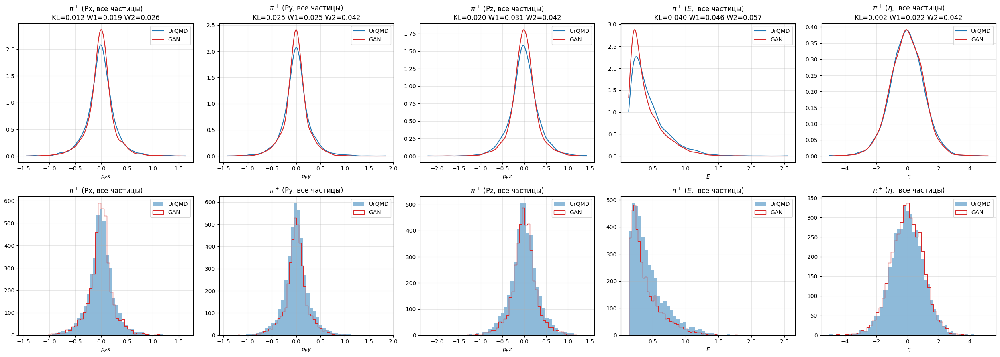

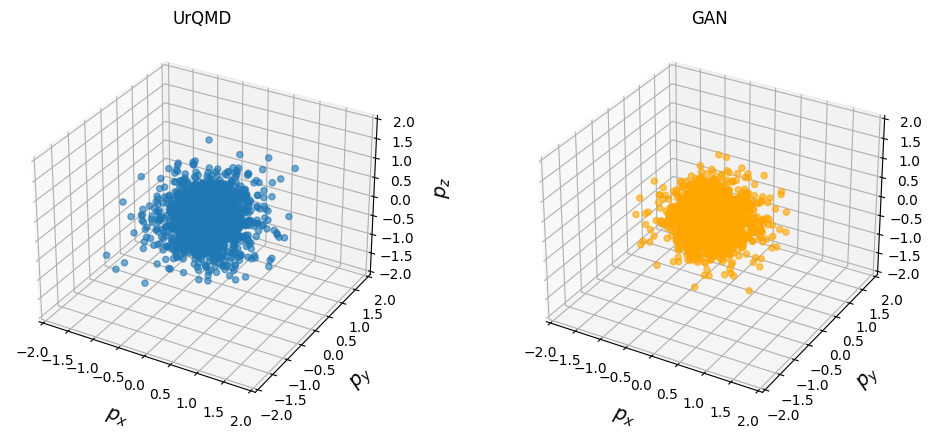

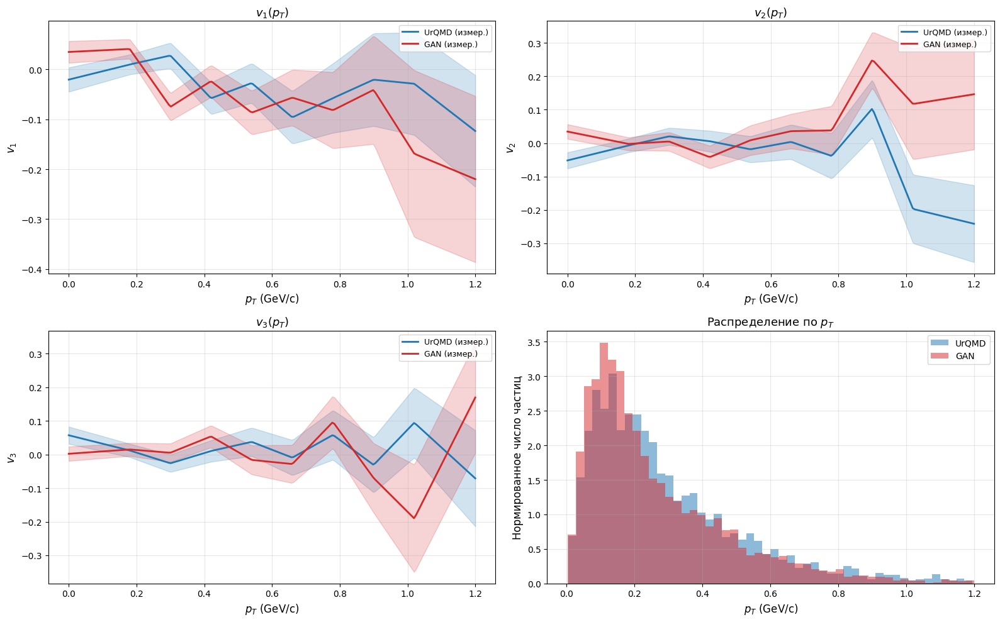

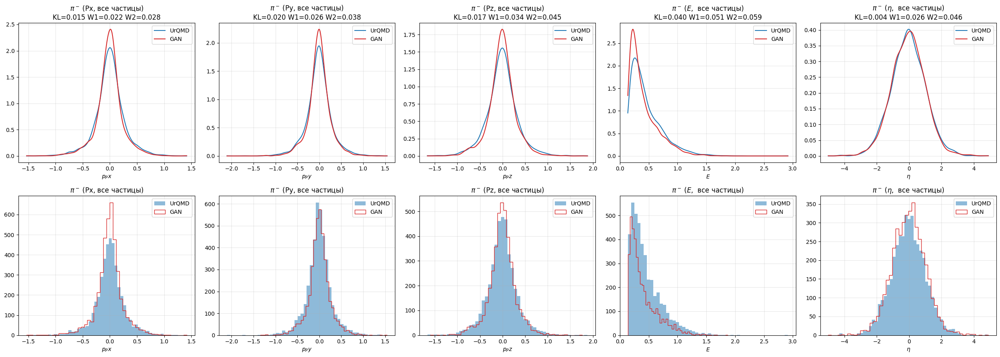

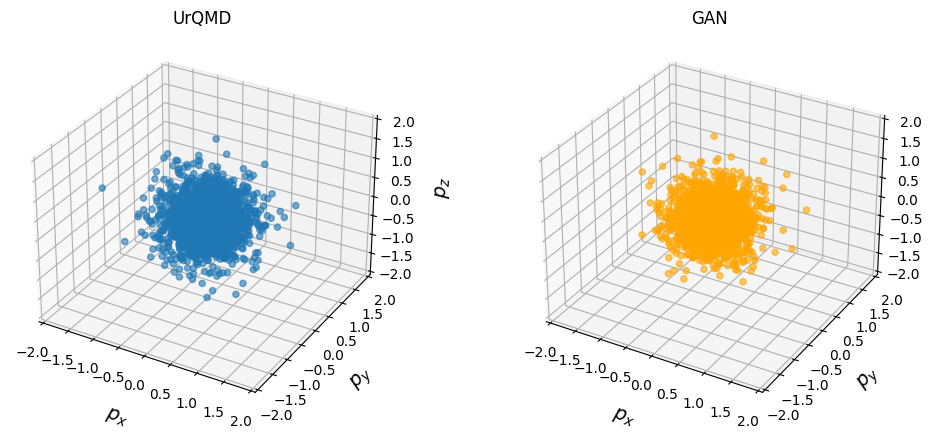

...

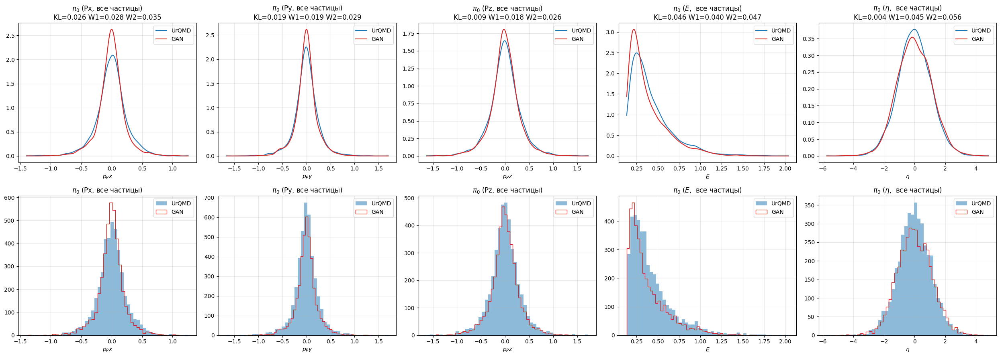

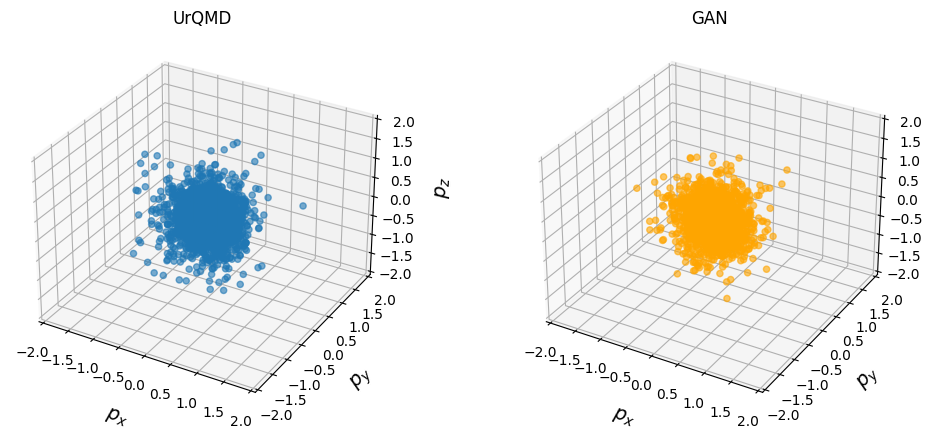

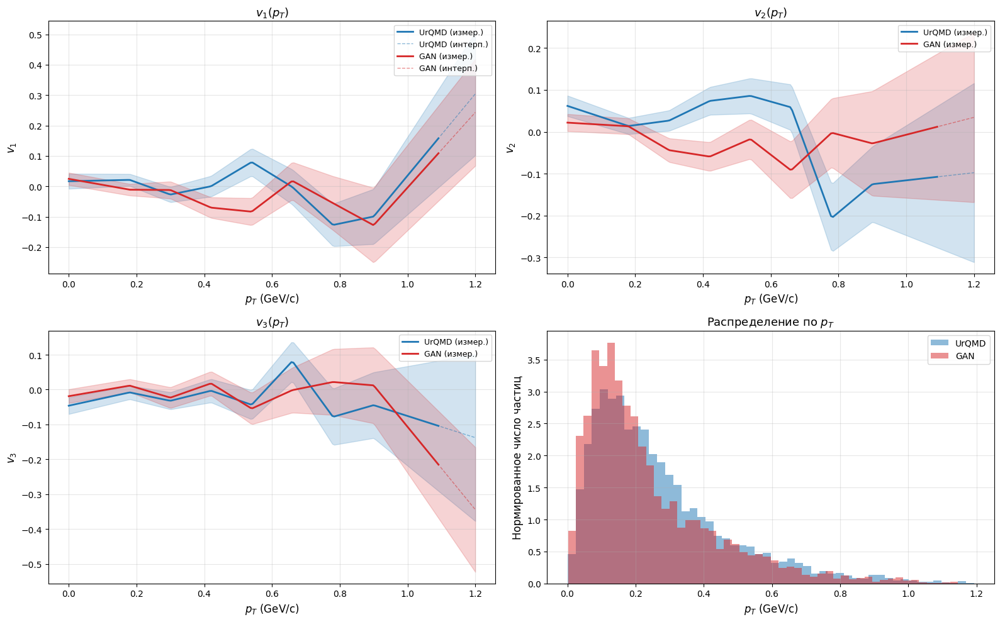

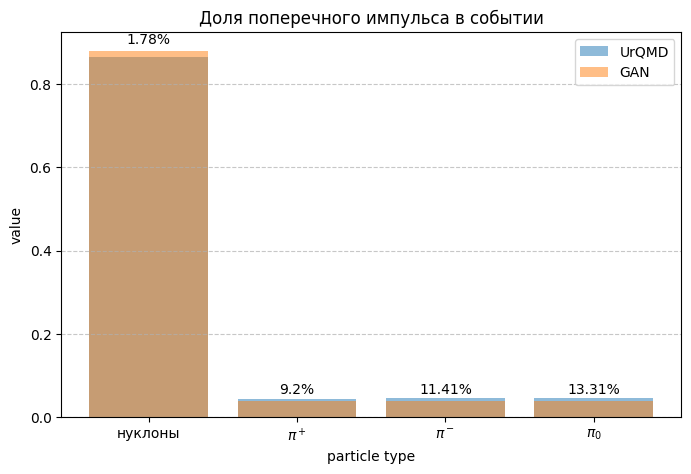

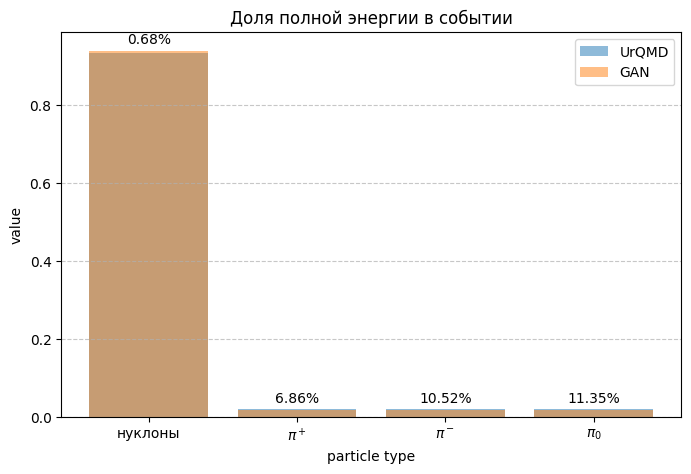

In [20]:
for seed in seeds:
    set_seed(seed)
    ratio = 1
    train_n_1_7 = int(0.8 * len(urqmd_1_7))
    val_n_1_7 = (len(urqmd_1_7) - train_n_1_7) // 2
    train_n_5 = ratio * train_n_1_7
    val_n_5 = ratio * val_n_1_7
    ids_1_7 = np.random.permutation(len(urqmd_1_7))
    ids_5 = np.random.permutation(len(urqmd_5))
    urqmd_train_1_7 = urqmd_1_7.iloc[ids_1_7[:train_n_1_7]]
    urqmd_val_1_7 = urqmd_1_7.iloc[ids_1_7[train_n_1_7 : train_n_1_7 + val_n_1_7]]
    urqmd_test_1_7 = urqmd_1_7.iloc[
        ids_1_7[train_n_1_7 + val_n_1_7 : train_n_1_7 + val_n_1_7 * 2]
    ]
    urqmd_train_5 = urqmd_5.iloc[ids_5[:train_n_5]]
    urqmd_val_5 = urqmd_5.iloc[ids_5[train_n_5 : train_n_5 + val_n_5]]
    urqmd_test_5 = urqmd_5.iloc[ids_5[train_n_5 + val_n_5 : train_n_5 + val_n_5 * 2]]
    urqmd_train = pd.concat([urqmd_train_1_7, urqmd_train_5], ignore_index=True)
    urqmd_val = pd.concat([urqmd_val_1_7, urqmd_val_5], ignore_index=True)
    COUNT = {}
    COUNT_2 = {}
    for code in particles:
        selected_count = urqmd_train.apply(
            lambda x: (np.array(x["fParticles.fPdg"]) == code).sum(), axis=1
        ).values
        final_count = (
            int(np.percentile(selected_count, 0.95))
            if code in pions
            else selected_count.max()
        )
        mean_ = np.mean(selected_count)
        std_ = np.std(selected_count)
        if final_count == 0:
            final_count = int(selected_count.max())
        COUNT[code] = final_count
        COUNT_2[code] = {"mean": mean_, "std": std_}
    meson_count_max = max(
        {k: v for k, v in COUNT.items() if k not in nucleons}.values()
    )
    nucleon_count_max = max({k: v for k, v in COUNT.items() if k in nucleons}.values())
    train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(
        urqmd_train,
        max_size_t=meson_count_max,
        max_size_c=nucleon_count_max,
        return_cols=True,
    )
    val = preprocess_urqmd(
        urqmd_val, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_1_7 = preprocess_urqmd(
        urqmd_test_1_7, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_5 = preprocess_urqmd(
        urqmd_test_5, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    means = {}
    stds = {}
    for col in cond_cols:
        means[col] = train[col].mean()
        stds[col] = train[col].std()
        train[col] = (train[col] - means[col]) / stds[col]
        val[col] = (val[col] - means[col]) / stds[col]
        test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
        test_5[col] = (test_5[col] - means[col]) / stds[col]
    train_cond = train[cond_cols].values.astype(float)
    train_nucl = list(train[nucl_cols[0]].values)
    train_nucl_mask = list(train[nucl_mask_cols[0]].values)
    train_label = train["label"].values
    train_event = train["event"].values
    train_mom = list(train["target_moms"].values)
    train_mask = list(train["target_mask"].values)
    val_cond = val[cond_cols].values.astype(float)
    val_nucl = list(val[nucl_cols[0]].values)
    val_nucl_mask = list(val[nucl_mask_cols[0]].values)
    val_label = val["label"].values
    val_event = val["event"].values
    val_mom = list(val["target_moms"].values)
    val_mask = list(val["target_mask"].values)
    test_1_7_cond = test_1_7[cond_cols].values.astype(float)
    test_1_7_nucl = list(test_1_7[nucl_cols[0]].values)
    test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols[0]].values)
    test_1_7_label = test_1_7["label"].values
    test_1_7_event = test_1_7["event"].values
    test_1_7_mom = list(test_1_7["target_moms"].values)
    test_1_7_mask = list(test_1_7["target_mask"].values)
    test_5_cond = test_5[cond_cols].values.astype(float)
    test_5_nucl = list(test_5[nucl_cols[0]].values)
    test_5_nucl_mask = list(test_5[nucl_mask_cols[0]].values)
    test_5_label = test_5["label"].values
    test_5_event = test_5["event"].values
    test_5_mom = list(test_5["target_moms"].values)
    test_5_mask = list(test_5["target_mask"].values)
    urqmd_train_dataset = TensorDataset(
        torch.tensor(train_mom, dtype=torch.float32),
        torch.tensor(train_cond, dtype=torch.float32),
        torch.tensor(train_label),
        torch.tensor(train_mask, dtype=torch.float32),
    )
    urqmd_train_dataloader = DataLoader(
        urqmd_train_dataset, batch_size=batch_size, shuffle=True
    )
    num_classes = len(pions)
    extern_cond_d = len(cond_cols)
    G = Pion_Gan_Generator(
        latent_global=latent_dim,
        latent_local=latent_local_dim,
        num_labels=num_classes,
        feats=feat_dim,
        max_len=meson_count_max,
        d_model=hid_dim,
        n_heads=n_heads,
        extern_cond_d=extern_cond_d,
        d_ff=hid_dim * 2,
        n_modes=n_modes,
        n_layers=num_layers_gen,
        use_learnable_noise=False,
        #  use_weight_norm=True
    ).to(device)
    D = Pion_Gan_Discriminator(
        num_labels=num_classes,
        feats=feat_dim,
        d_model=hid_dim,
        n_heads=n_heads,
        d_ff=hid_dim * 2,
        extern_cond_d=extern_cond_d,
        n_layers=num_layers_disc,
        #  use_weight_norm=True
    ).to(device)

    opt_g = optim.Adam(G.parameters(), lr=lr, betas=betas)
    opt_d = optim.Adam(D.parameters(), lr=lr, betas=betas)

    G, G_shadow, D = train_and_test(
        G=G,
        D=D,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_transformer,
        generate_func=generate_transformer,
        val_mom_obj={0: val_mom},
        val_cond_obj={0: val_cond},
        val_label_obj={0: val_label},
        val_mask_obj={0: val_mask},
        val_nucl_mask_obj={0: val_nucl_mask},
        val_nucl_obj={0: val_nucl},
        val_event_obj={0: val_event},
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=G.__class__.__name__,
        final_metrics=METRICS,
        seeds=[seed],
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=True,
        ema_beta=0.999,
        model_name="pion_gan",
    )

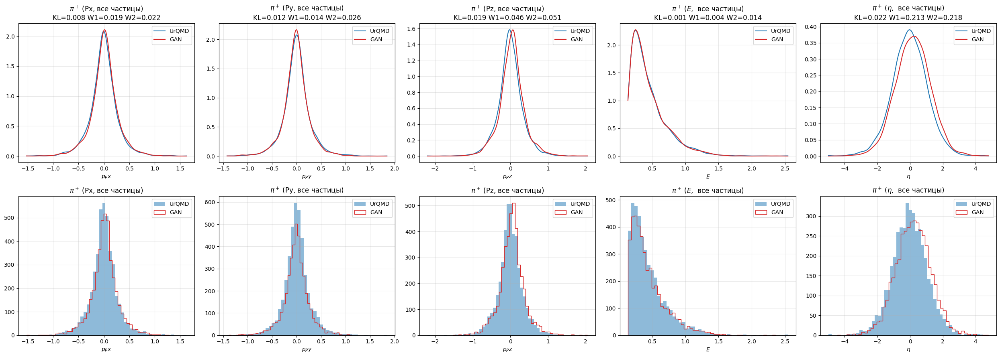

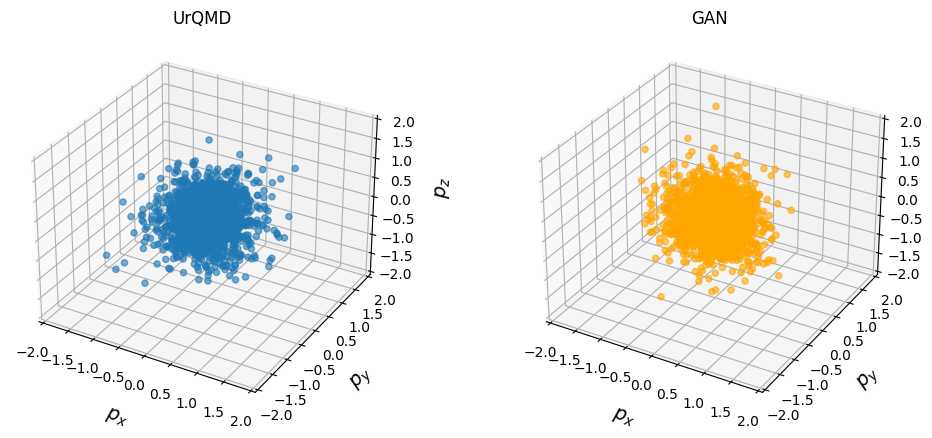

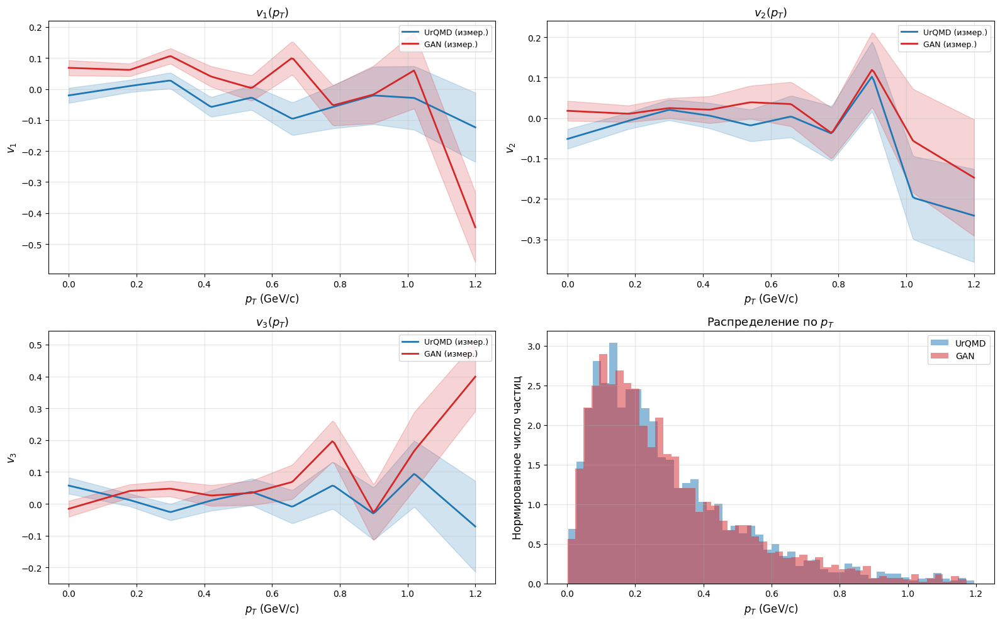

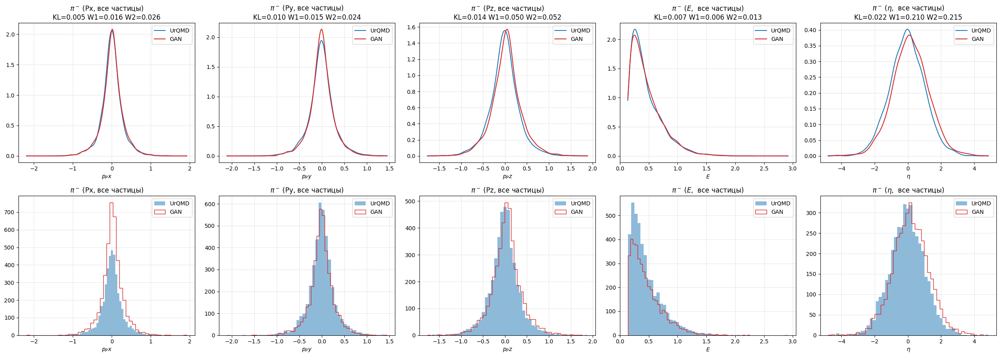

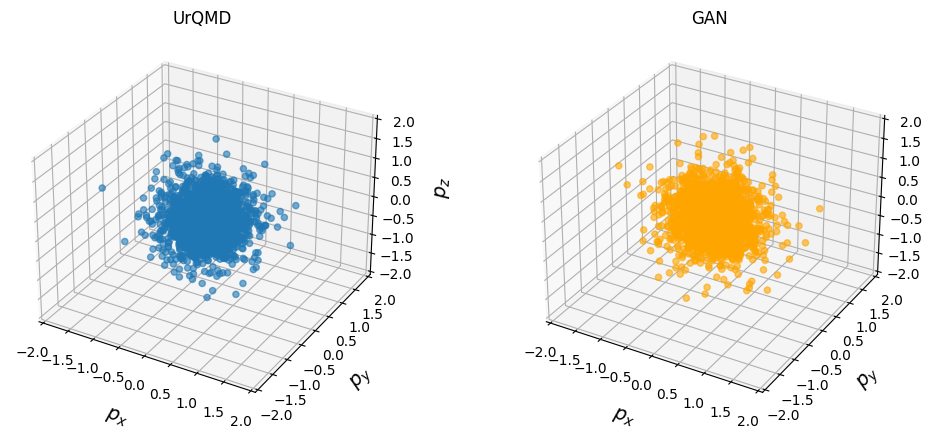

...

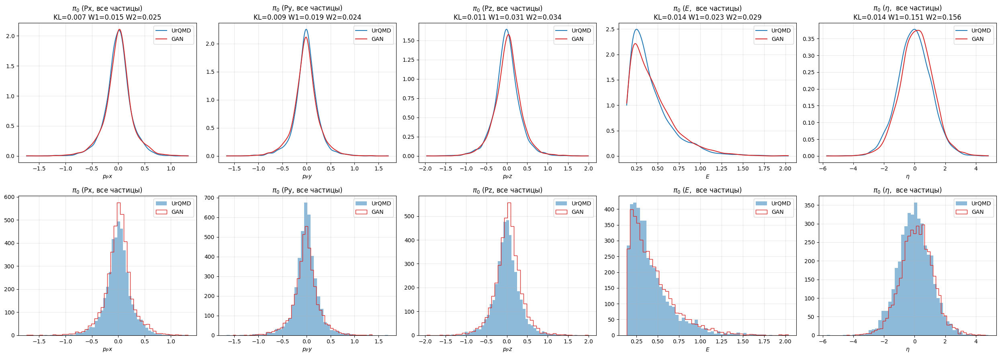

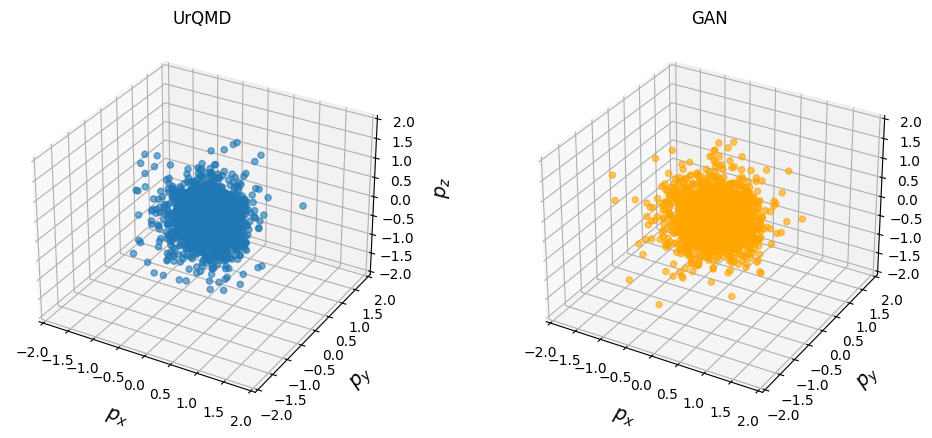

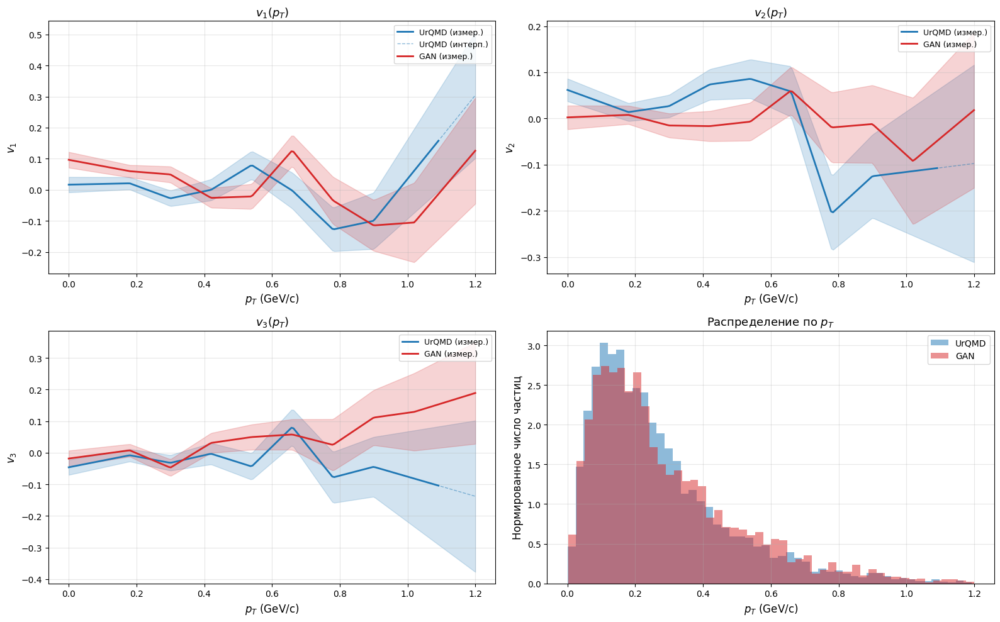

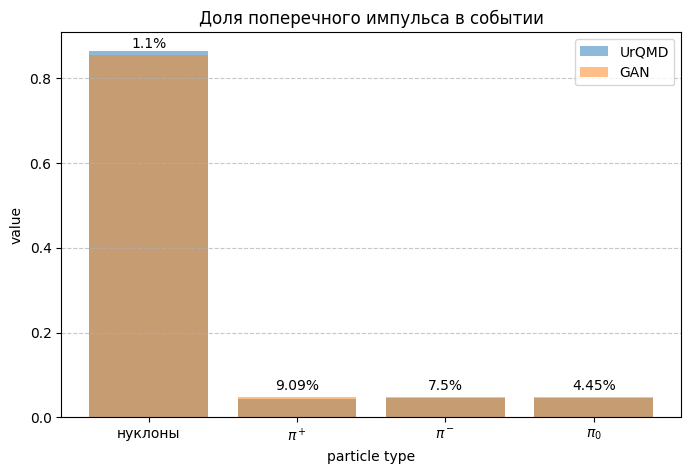

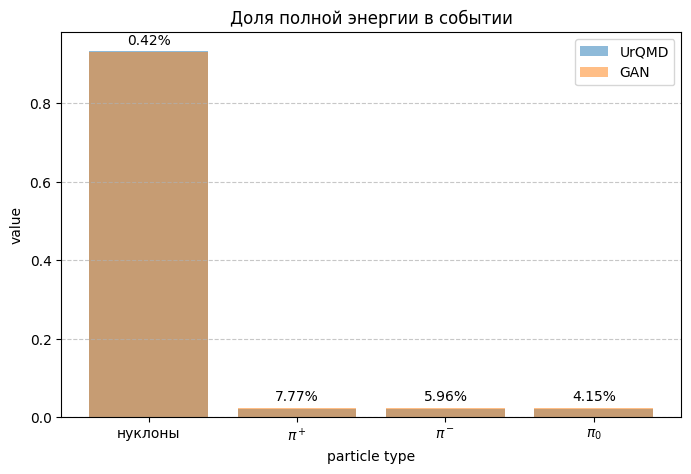

In [21]:
latent_dim = 128
latent_local_dim = 16
hid_dim = 128
num_classes = len(pions)
feat_dim = 3
epic_num_layers_gen = 3
epic_num_layers_disc = 3

for seed in seeds:
    set_seed(seed)
    ratio = 1
    train_n_1_7 = int(0.8 * len(urqmd_1_7))
    val_n_1_7 = (len(urqmd_1_7) - train_n_1_7) // 2
    train_n_5 = ratio * train_n_1_7
    val_n_5 = ratio * val_n_1_7
    ids_1_7 = np.random.permutation(len(urqmd_1_7))
    ids_5 = np.random.permutation(len(urqmd_5))
    urqmd_train_1_7 = urqmd_1_7.iloc[ids_1_7[:train_n_1_7]]
    urqmd_val_1_7 = urqmd_1_7.iloc[ids_1_7[train_n_1_7 : train_n_1_7 + val_n_1_7]]
    urqmd_test_1_7 = urqmd_1_7.iloc[
        ids_1_7[train_n_1_7 + val_n_1_7 : train_n_1_7 + val_n_1_7 * 2]
    ]
    urqmd_train_5 = urqmd_5.iloc[ids_5[:train_n_5]]
    urqmd_val_5 = urqmd_5.iloc[ids_5[train_n_5 : train_n_5 + val_n_5]]
    urqmd_test_5 = urqmd_5.iloc[ids_5[train_n_5 + val_n_5 : train_n_5 + val_n_5 * 2]]
    urqmd_train = pd.concat([urqmd_train_1_7, urqmd_train_5], ignore_index=True)
    urqmd_val = pd.concat([urqmd_val_1_7, urqmd_val_5], ignore_index=True)
    COUNT = {}
    COUNT_2 = {}
    for code in particles:
        selected_count = urqmd_train.apply(
            lambda x: (np.array(x["fParticles.fPdg"]) == code).sum(), axis=1
        ).values
        final_count = (
            int(np.percentile(selected_count, 0.95))
            if code in pions
            else selected_count.max()
        )
        mean_ = np.mean(selected_count)
        std_ = np.std(selected_count)
        if final_count == 0:
            final_count = int(selected_count.max())
        COUNT[code] = final_count
        COUNT_2[code] = {"mean": mean_, "std": std_}
    meson_count_max = max(
        {k: v for k, v in COUNT.items() if k not in nucleons}.values()
    )
    nucleon_count_max = max({k: v for k, v in COUNT.items() if k in nucleons}.values())
    train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(
        urqmd_train,
        max_size_t=meson_count_max,
        max_size_c=nucleon_count_max,
        return_cols=True,
    )
    val = preprocess_urqmd(
        urqmd_val, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_1_7 = preprocess_urqmd(
        urqmd_test_1_7, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_5 = preprocess_urqmd(
        urqmd_test_5, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    means = {}
    stds = {}
    for col in cond_cols:
        means[col] = train[col].mean()
        stds[col] = train[col].std()
        train[col] = (train[col] - means[col]) / stds[col]
        val[col] = (val[col] - means[col]) / stds[col]
        test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
        test_5[col] = (test_5[col] - means[col]) / stds[col]
    train_cond = train[cond_cols].values.astype(float)
    train_nucl = list(train[nucl_cols[0]].values)
    train_nucl_mask = list(train[nucl_mask_cols[0]].values)
    train_label = train["label"].values
    train_event = train["event"].values
    train_mom = list(train["target_moms"].values)
    train_mask = list(train["target_mask"].values)
    val_cond = val[cond_cols].values.astype(float)
    val_nucl = list(val[nucl_cols[0]].values)
    val_nucl_mask = list(val[nucl_mask_cols[0]].values)
    val_label = val["label"].values
    val_event = val["event"].values
    val_mom = list(val["target_moms"].values)
    val_mask = list(val["target_mask"].values)
    test_1_7_cond = test_1_7[cond_cols].values.astype(float)
    test_1_7_nucl = list(test_1_7[nucl_cols[0]].values)
    test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols[0]].values)
    test_1_7_label = test_1_7["label"].values
    test_1_7_event = test_1_7["event"].values
    test_1_7_mom = list(test_1_7["target_moms"].values)
    test_1_7_mask = list(test_1_7["target_mask"].values)
    test_5_cond = test_5[cond_cols].values.astype(float)
    test_5_nucl = list(test_5[nucl_cols[0]].values)
    test_5_nucl_mask = list(test_5[nucl_mask_cols[0]].values)
    test_5_label = test_5["label"].values
    test_5_event = test_5["event"].values
    test_5_mom = list(test_5["target_moms"].values)
    test_5_mask = list(test_5["target_mask"].values)
    urqmd_train_dataset = TensorDataset(
        torch.tensor(train_mom, dtype=torch.float32),
        torch.tensor(train_cond, dtype=torch.float32),
        torch.tensor(train_label),
        torch.tensor(train_mask, dtype=torch.float32),
    )
    urqmd_train_dataloader = DataLoader(
        urqmd_train_dataset, batch_size=batch_size, shuffle=True
    )
    num_classes = len(pions)
    extern_cond_d = len(cond_cols)
    G_epic = EPiC_generator(
        latent=latent_dim,
        latent_local=latent_local_dim,
        hid_d=hid_dim,
        feats=feat_dim,
        equiv_layers_generator=epic_num_layers_gen,
        extern_cond_d=extern_cond_d,
        num_labels=num_classes,
    ).to(device)
    D_epic = EPiC_discriminator(
        latent=latent_dim,
        hid_d=hid_dim,
        feats=feat_dim,
        equiv_layers_discriminator=epic_num_layers_disc,
        extern_cond_d=extern_cond_d,
        num_labels=num_classes,
    ).to(device)

    opt_g = optim.Adam(G_epic.parameters(), lr=lr, betas=betas)
    opt_d = optim.Adam(D_epic.parameters(), lr=lr, betas=betas)

    G_epic, G_epic_shadow, D_epic = train_and_test(
        G=G_epic,
        D=D_epic,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_epic,
        generate_func=generate_epic,
        val_mom_obj={0: val_mom},
        val_cond_obj={0: val_cond},
        val_label_obj={0: val_label},
        val_mask_obj={0: val_mask},
        val_nucl_mask_obj={0: val_nucl_mask},
        val_nucl_obj={0: val_nucl},
        val_event_obj={0: val_event},
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=G_epic.__class__.__name__,
        final_metrics=METRICS,
        seeds=[seed],
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=False,
        model_name="epic_gan",
        zg_dim=latent_dim,
        zl_dim=latent_local_dim,
        counts=COUNT_2,
    )

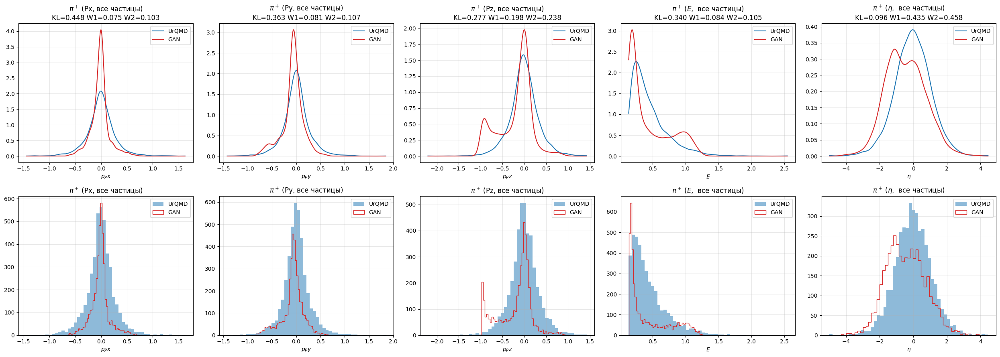

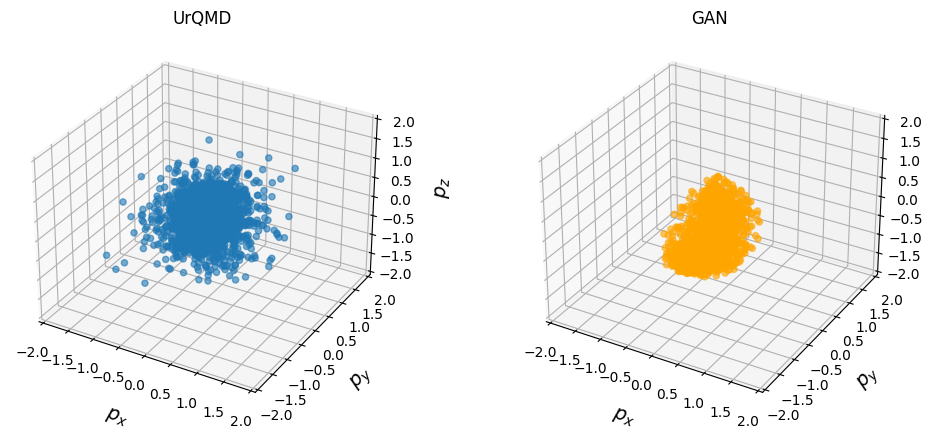

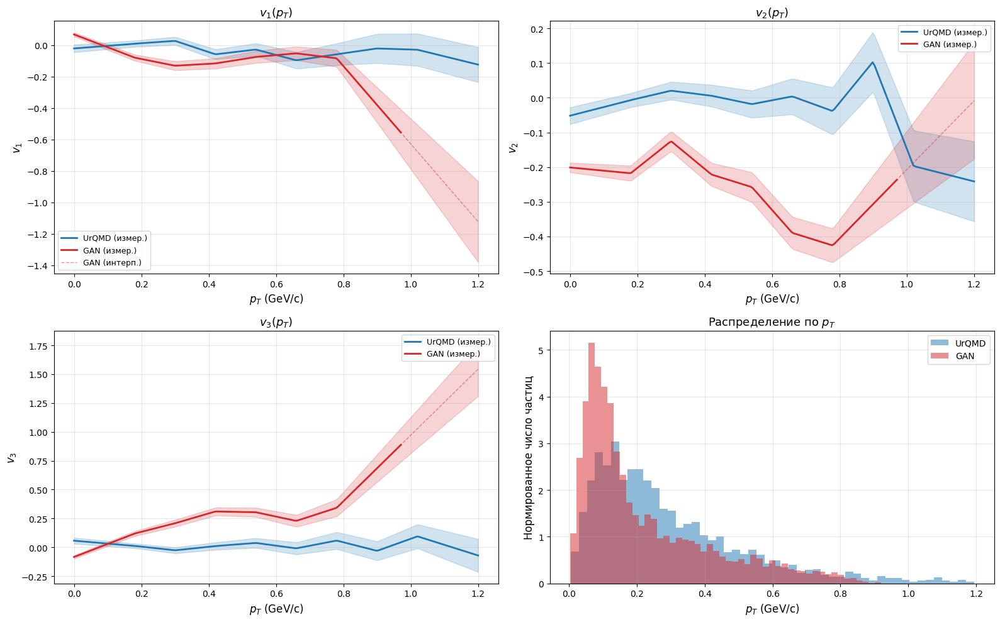

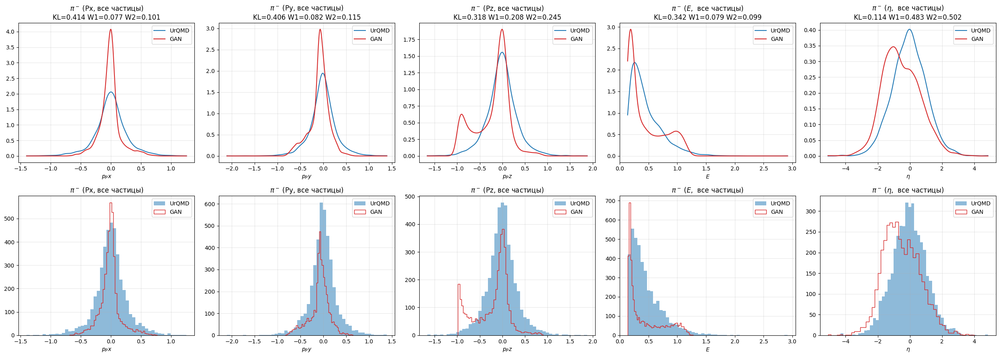

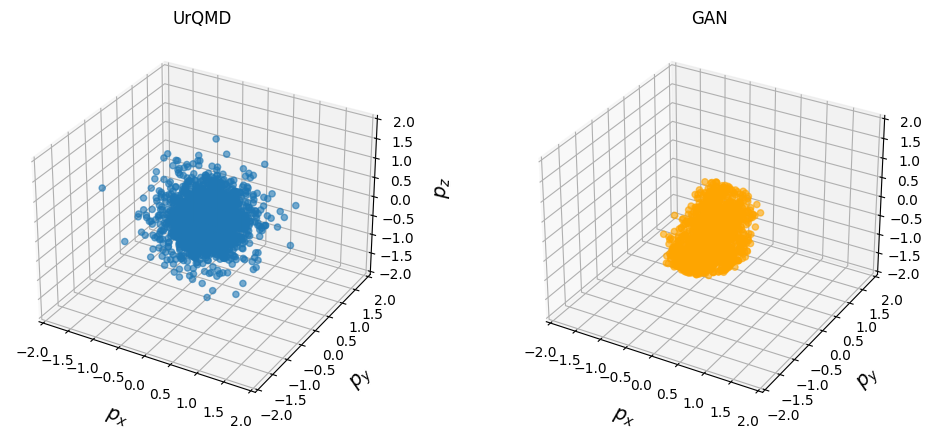

...

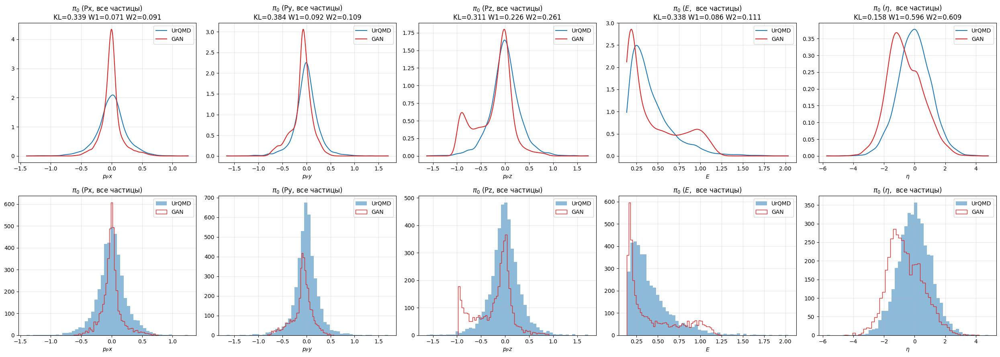

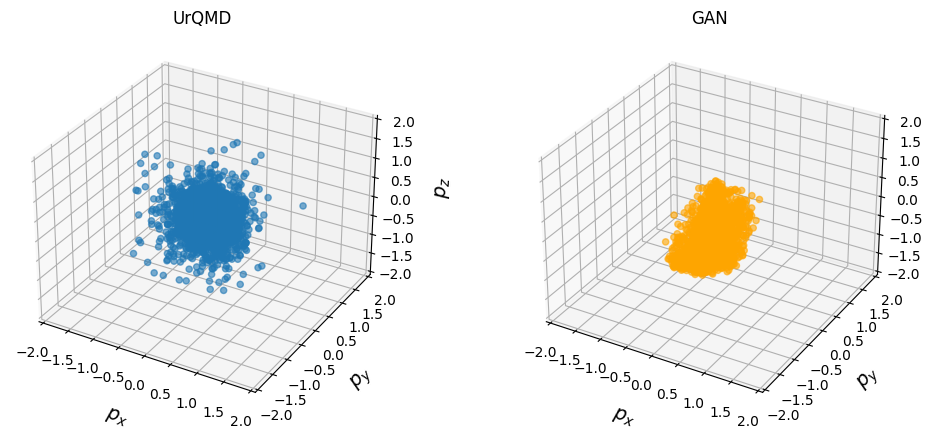

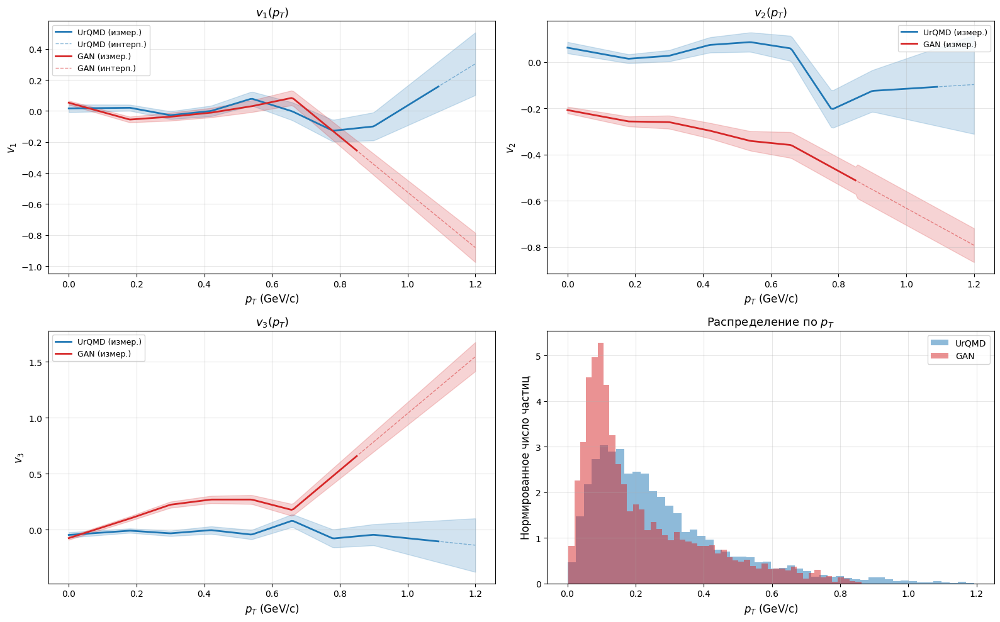

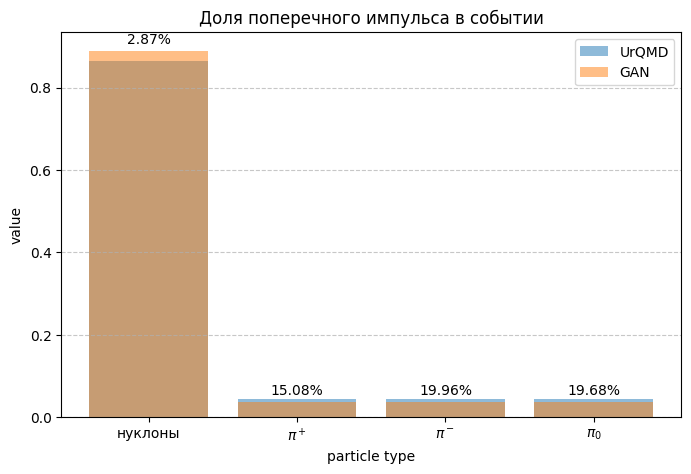

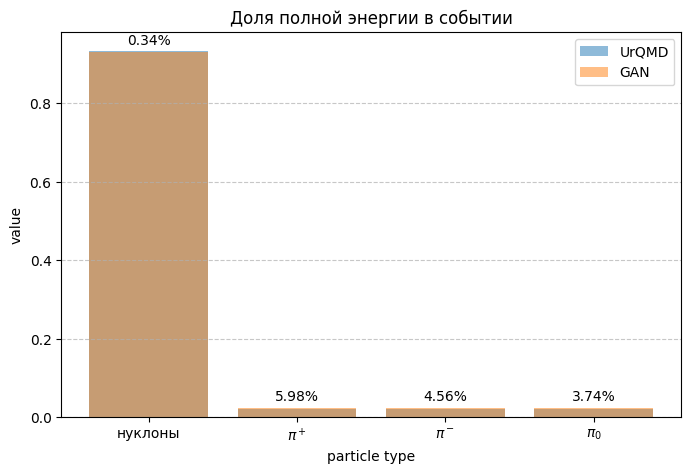

In [22]:
embed_dim = 64
num_heads = 4
sab_layers = 3
global_noise_feat_dim = 64
global_noise_layers = [128, 128]
init_noise_dim = 16
final_fc_layers = [128, 64]
condition_size = len(cond_cols)
betas_gapt = (0.5, 0.999)

for seed in seeds:
    set_seed(seed)
    ratio = 1
    train_n_1_7 = int(0.8 * len(urqmd_1_7))
    val_n_1_7 = (len(urqmd_1_7) - train_n_1_7) // 2
    train_n_5 = ratio * train_n_1_7
    val_n_5 = ratio * val_n_1_7
    ids_1_7 = np.random.permutation(len(urqmd_1_7))
    ids_5 = np.random.permutation(len(urqmd_5))
    urqmd_train_1_7 = urqmd_1_7.iloc[ids_1_7[:train_n_1_7]]
    urqmd_val_1_7 = urqmd_1_7.iloc[ids_1_7[train_n_1_7 : train_n_1_7 + val_n_1_7]]
    urqmd_test_1_7 = urqmd_1_7.iloc[
        ids_1_7[train_n_1_7 + val_n_1_7 : train_n_1_7 + val_n_1_7 * 2]
    ]
    urqmd_train_5 = urqmd_5.iloc[ids_5[:train_n_5]]
    urqmd_val_5 = urqmd_5.iloc[ids_5[train_n_5 : train_n_5 + val_n_5]]
    urqmd_test_5 = urqmd_5.iloc[ids_5[train_n_5 + val_n_5 : train_n_5 + val_n_5 * 2]]
    urqmd_train = pd.concat([urqmd_train_1_7, urqmd_train_5], ignore_index=True)
    urqmd_val = pd.concat([urqmd_val_1_7, urqmd_val_5], ignore_index=True)
    COUNT = {}
    COUNT_2 = {}
    for code in particles:
        selected_count = urqmd_train.apply(
            lambda x: (np.array(x["fParticles.fPdg"]) == code).sum(), axis=1
        ).values
        final_count = (
            int(np.percentile(selected_count, 0.95))
            if code in pions
            else selected_count.max()
        )
        mean_ = np.mean(selected_count)
        std_ = np.std(selected_count)
        if final_count == 0:
            final_count = int(selected_count.max())
        COUNT[code] = final_count
        COUNT_2[code] = {"mean": mean_, "std": std_}
    meson_count_max = max(
        {k: v for k, v in COUNT.items() if k not in nucleons}.values()
    )
    nucleon_count_max = max({k: v for k, v in COUNT.items() if k in nucleons}.values())
    train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(
        urqmd_train,
        max_size_t=meson_count_max,
        max_size_c=nucleon_count_max,
        return_cols=True,
    )
    val = preprocess_urqmd(
        urqmd_val, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_1_7 = preprocess_urqmd(
        urqmd_test_1_7, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_5 = preprocess_urqmd(
        urqmd_test_5, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    means = {}
    stds = {}
    for col in cond_cols:
        means[col] = train[col].mean()
        stds[col] = train[col].std()
        train[col] = (train[col] - means[col]) / stds[col]
        val[col] = (val[col] - means[col]) / stds[col]
        test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
        test_5[col] = (test_5[col] - means[col]) / stds[col]
    train_cond = train[cond_cols].values.astype(float)
    train_nucl = list(train[nucl_cols[0]].values)
    train_nucl_mask = list(train[nucl_mask_cols[0]].values)
    train_label = train["label"].values
    train_event = train["event"].values
    train_mom = list(train["target_moms"].values)
    train_mask = list(train["target_mask"].values)
    val_cond = val[cond_cols].values.astype(float)
    val_nucl = list(val[nucl_cols[0]].values)
    val_nucl_mask = list(val[nucl_mask_cols[0]].values)
    val_label = val["label"].values
    val_event = val["event"].values
    val_mom = list(val["target_moms"].values)
    val_mask = list(val["target_mask"].values)
    test_1_7_cond = test_1_7[cond_cols].values.astype(float)
    test_1_7_nucl = list(test_1_7[nucl_cols[0]].values)
    test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols[0]].values)
    test_1_7_label = test_1_7["label"].values
    test_1_7_event = test_1_7["event"].values
    test_1_7_mom = list(test_1_7["target_moms"].values)
    test_1_7_mask = list(test_1_7["target_mask"].values)
    test_5_cond = test_5[cond_cols].values.astype(float)
    test_5_nucl = list(test_5[nucl_cols[0]].values)
    test_5_nucl_mask = list(test_5[nucl_mask_cols[0]].values)
    test_5_label = test_5["label"].values
    test_5_event = test_5["event"].values
    test_5_mom = list(test_5["target_moms"].values)
    test_5_mask = list(test_5["target_mask"].values)
    urqmd_train_dataset = TensorDataset(
        torch.tensor(train_mom, dtype=torch.float32),
        torch.tensor(train_cond, dtype=torch.float32),
        torch.tensor(train_label),
        torch.tensor(train_mask, dtype=torch.float32),
    )
    urqmd_train_dataloader = DataLoader(
        urqmd_train_dataset, batch_size=batch_size, shuffle=True
    )
    num_classes = len(pions)
    extern_cond_d = len(cond_cols)
    G_gapt = GAPT_G(
        num_particles=meson_count_max,
        condition_size=condition_size,
        num_labels=num_classes,
        output_feat_size=feat_dim,
        global_noise_feat_dim=global_noise_feat_dim,
        global_noise_layers=global_noise_layers,
        init_noise_dim=init_noise_dim,
        embed_dim=embed_dim,
        sab_layers=sab_layers,
        num_heads=num_heads,
        sab_fc_layers=[128, 128],
        use_custom_mab=False,
        layer_norm=True,
        spectral_norm=False,
        dropout_p=0.1,
        final_fc_layers=final_fc_layers,
        use_isab=True,
        num_isab_nodes=16,
        learn_anchor_from_global_noise=True,
        block_residual=True,
        linear_args={},
    ).to(device)
    D_gapt = GAPT_D(
        num_particles=meson_count_max,
        input_feat_size=feat_dim,
        num_labels=num_classes,
        embed_dim=embed_dim,
        sab_layers=sab_layers,
        num_heads=num_heads,
        sab_fc_layers=[128, 128],
        cond_feat_dim=global_noise_feat_dim,
        cond_net_layers=[64, 64],
        use_custom_mab=False,
        layer_norm=True,
        spectral_norm=False,
        dropout_p=0.1,
        final_fc_layers=[64, 32],
        use_isab=True,
        num_isab_nodes=16,
        use_ise=True,
        num_ise_nodes=16,
        block_residual=True,
        linear_args={},
    ).to(device)

    opt_g = torch.optim.Adam(G_gapt.parameters(), lr=lr, betas=betas_gapt)
    opt_d = torch.optim.Adam(D_gapt.parameters(), lr=lr, betas=betas_gapt)

    G_gapt, G_gapt_shadow, D_gapt = train_and_test(
        G=G_gapt,
        D=D_gapt,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_gapt,
        generate_func=generate_gapt,
        val_mom_obj={0: val_mom},
        val_cond_obj={0: val_cond},
        val_label_obj={0: val_label},
        val_mask_obj={0: val_mask},
        val_nucl_mask_obj={0: val_nucl_mask},
        val_nucl_obj={0: val_nucl},
        val_event_obj={0: val_event},
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=G_gapt.__class__.__name__,
        final_metrics=METRICS,
        seeds=[seed],
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=False,
        model_name="gapt",
    )

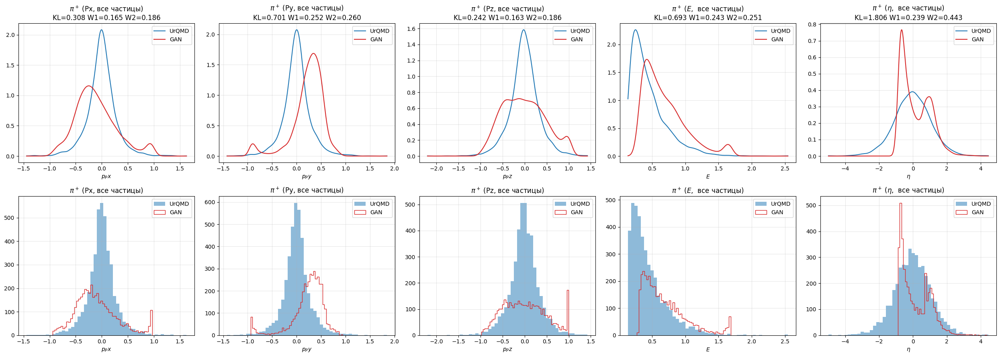

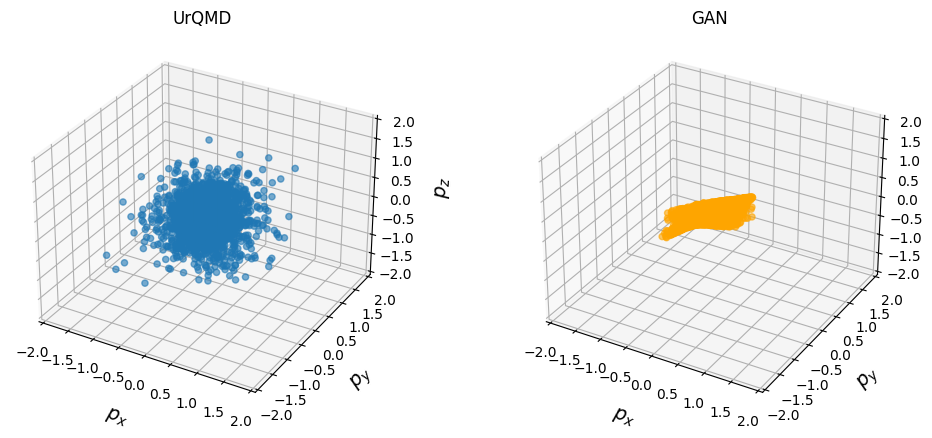

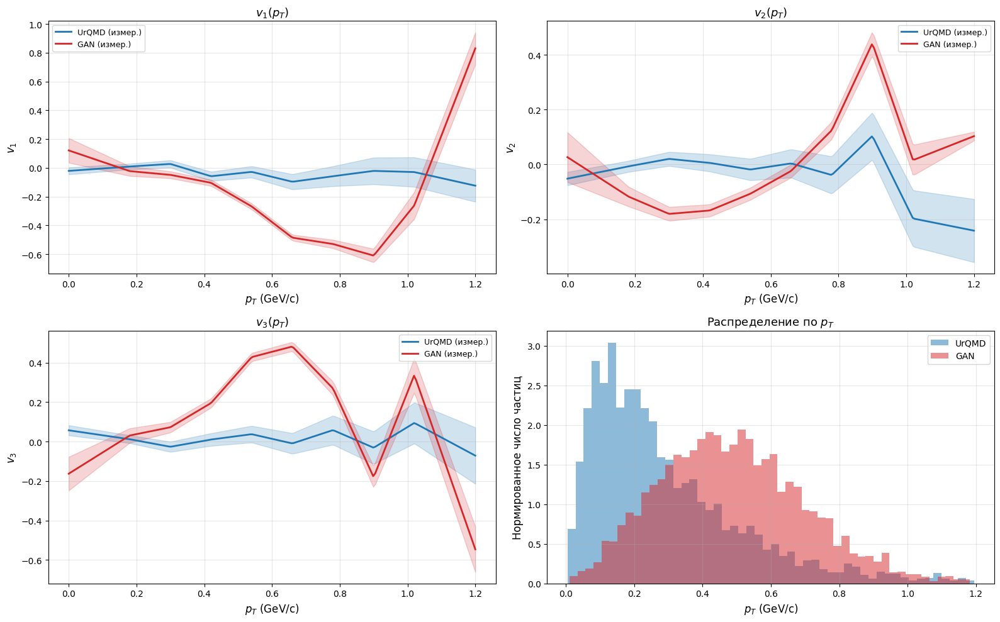

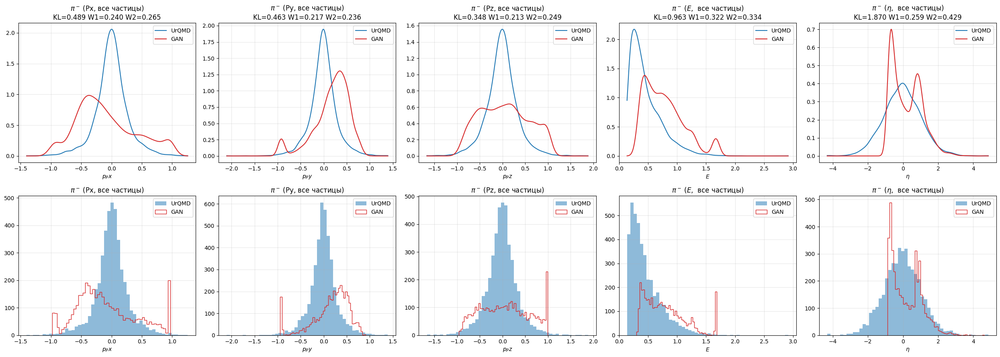

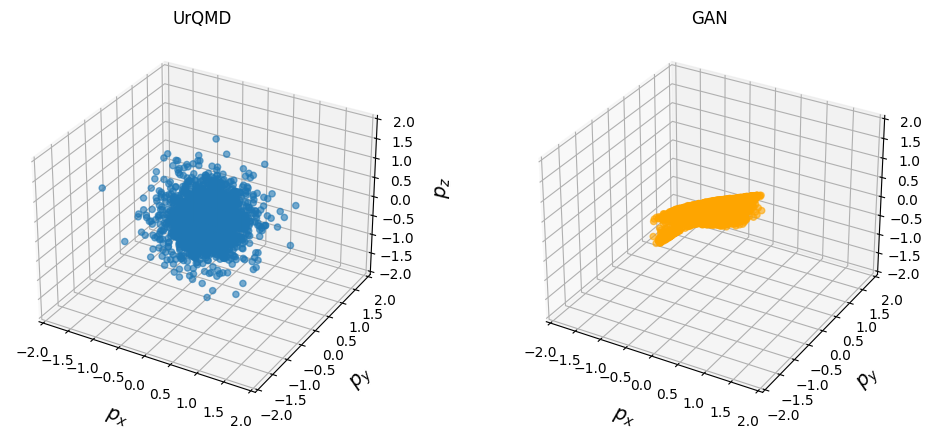

...

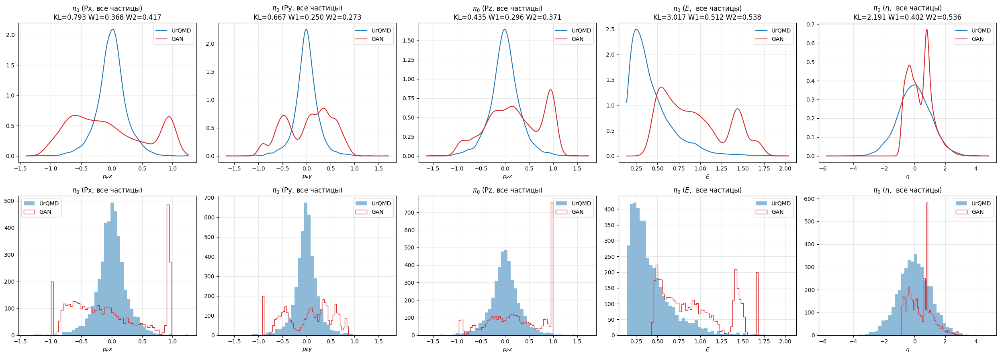

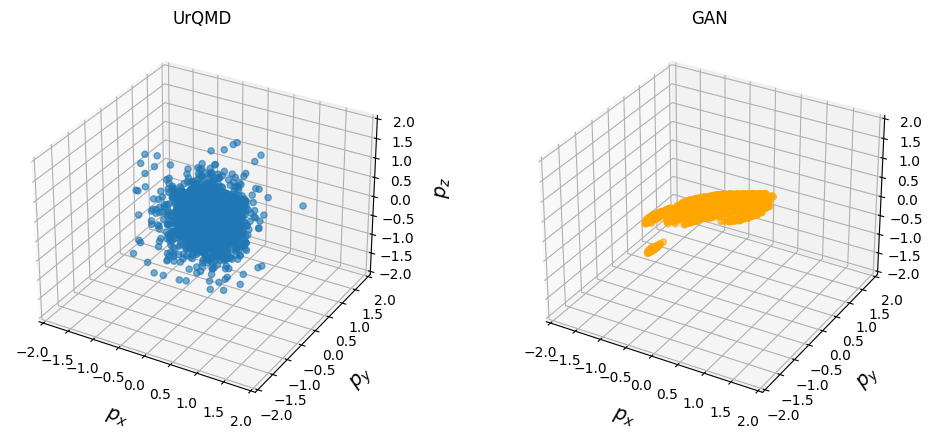

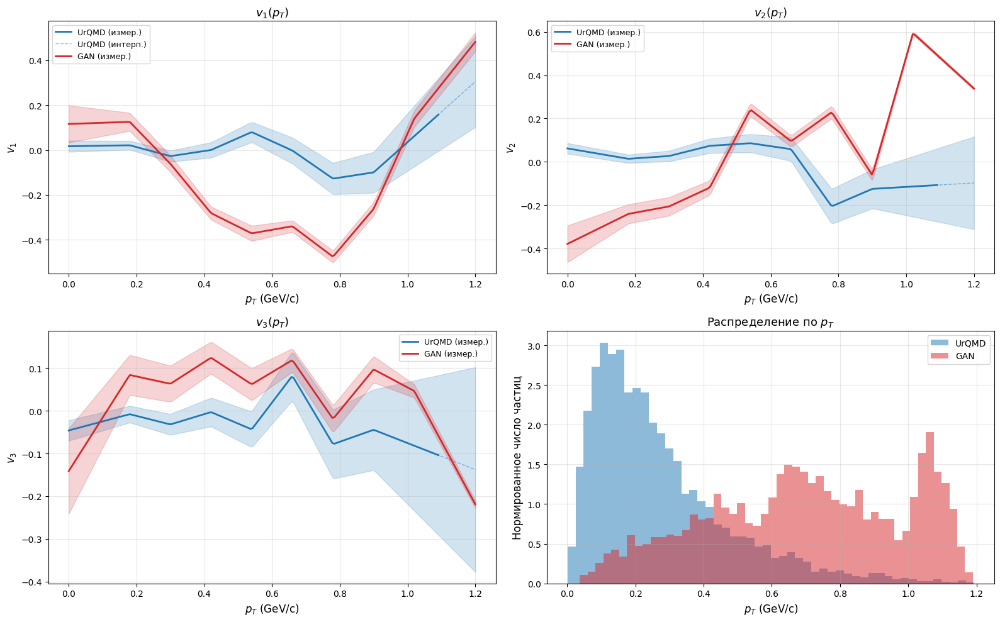

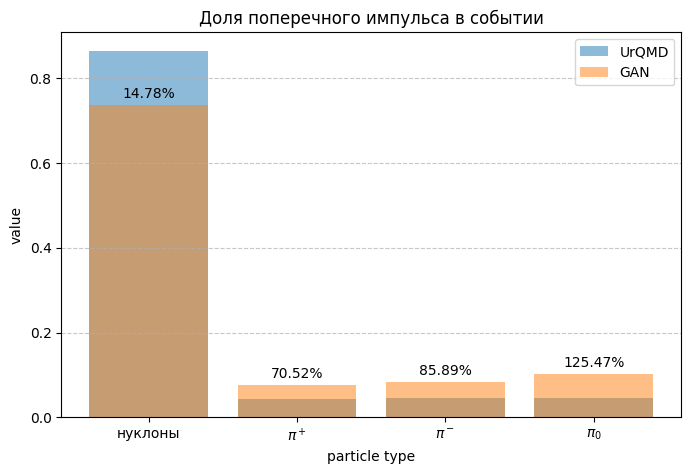

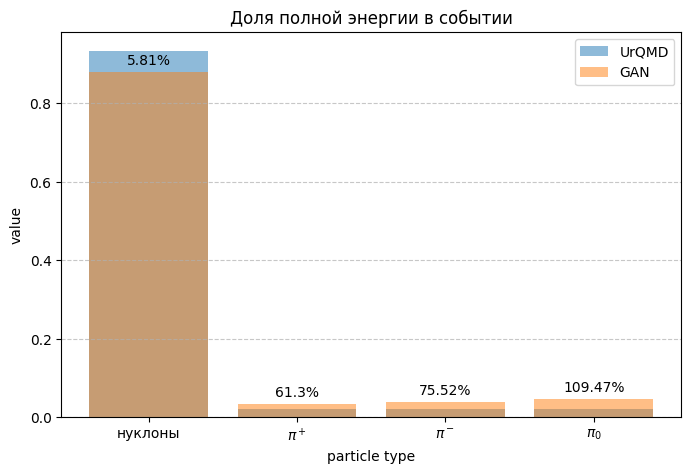

In [23]:
mp_iters = 3
hidden_node_size = 128
fe_layers = [128, 128]
fn_layers = [128, 128]
lfc_latent_size = 256

for seed in seeds:
    set_seed(seed)
    ratio = 1
    train_n_1_7 = int(0.8 * len(urqmd_1_7))
    val_n_1_7 = (len(urqmd_1_7) - train_n_1_7) // 2
    train_n_5 = ratio * train_n_1_7
    val_n_5 = ratio * val_n_1_7
    ids_1_7 = np.random.permutation(len(urqmd_1_7))
    ids_5 = np.random.permutation(len(urqmd_5))
    urqmd_train_1_7 = urqmd_1_7.iloc[ids_1_7[:train_n_1_7]]
    urqmd_val_1_7 = urqmd_1_7.iloc[ids_1_7[train_n_1_7 : train_n_1_7 + val_n_1_7]]
    urqmd_test_1_7 = urqmd_1_7.iloc[
        ids_1_7[train_n_1_7 + val_n_1_7 : train_n_1_7 + val_n_1_7 * 2]
    ]
    urqmd_train_5 = urqmd_5.iloc[ids_5[:train_n_5]]
    urqmd_val_5 = urqmd_5.iloc[ids_5[train_n_5 : train_n_5 + val_n_5]]
    urqmd_test_5 = urqmd_5.iloc[ids_5[train_n_5 + val_n_5 : train_n_5 + val_n_5 * 2]]
    urqmd_train = pd.concat([urqmd_train_1_7, urqmd_train_5], ignore_index=True)
    urqmd_val = pd.concat([urqmd_val_1_7, urqmd_val_5], ignore_index=True)
    COUNT = {}
    COUNT_2 = {}
    for code in particles:
        selected_count = urqmd_train.apply(
            lambda x: (np.array(x["fParticles.fPdg"]) == code).sum(), axis=1
        ).values
        final_count = (
            int(np.percentile(selected_count, 0.95))
            if code in pions
            else selected_count.max()
        )
        mean_ = np.mean(selected_count)
        std_ = np.std(selected_count)
        if final_count == 0:
            final_count = int(selected_count.max())
        COUNT[code] = final_count
        COUNT_2[code] = {"mean": mean_, "std": std_}
    meson_count_max = max(
        {k: v for k, v in COUNT.items() if k not in nucleons}.values()
    )
    nucleon_count_max = max({k: v for k, v in COUNT.items() if k in nucleons}.values())
    train, cond_cols, nucl_cols, nucl_mask_cols = preprocess_urqmd(
        urqmd_train,
        max_size_t=meson_count_max,
        max_size_c=nucleon_count_max,
        return_cols=True,
    )
    val = preprocess_urqmd(
        urqmd_val, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_1_7 = preprocess_urqmd(
        urqmd_test_1_7, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    test_5 = preprocess_urqmd(
        urqmd_test_5, max_size_t=meson_count_max, max_size_c=nucleon_count_max
    )
    means = {}
    stds = {}
    for col in cond_cols:
        means[col] = train[col].mean()
        stds[col] = train[col].std()
        train[col] = (train[col] - means[col]) / stds[col]
        val[col] = (val[col] - means[col]) / stds[col]
        test_1_7[col] = (test_1_7[col] - means[col]) / stds[col]
        test_5[col] = (test_5[col] - means[col]) / stds[col]
    train_cond = train[cond_cols].values.astype(float)
    train_nucl = list(train[nucl_cols[0]].values)
    train_nucl_mask = list(train[nucl_mask_cols[0]].values)
    train_label = train["label"].values
    train_event = train["event"].values
    train_mom = list(train["target_moms"].values)
    train_mask = list(train["target_mask"].values)
    val_cond = val[cond_cols].values.astype(float)
    val_nucl = list(val[nucl_cols[0]].values)
    val_nucl_mask = list(val[nucl_mask_cols[0]].values)
    val_label = val["label"].values
    val_event = val["event"].values
    val_mom = list(val["target_moms"].values)
    val_mask = list(val["target_mask"].values)
    test_1_7_cond = test_1_7[cond_cols].values.astype(float)
    test_1_7_nucl = list(test_1_7[nucl_cols[0]].values)
    test_1_7_nucl_mask = list(test_1_7[nucl_mask_cols[0]].values)
    test_1_7_label = test_1_7["label"].values
    test_1_7_event = test_1_7["event"].values
    test_1_7_mom = list(test_1_7["target_moms"].values)
    test_1_7_mask = list(test_1_7["target_mask"].values)
    test_5_cond = test_5[cond_cols].values.astype(float)
    test_5_nucl = list(test_5[nucl_cols[0]].values)
    test_5_nucl_mask = list(test_5[nucl_mask_cols[0]].values)
    test_5_label = test_5["label"].values
    test_5_event = test_5["event"].values
    test_5_mom = list(test_5["target_moms"].values)
    test_5_mask = list(test_5["target_mask"].values)
    urqmd_train_dataset = TensorDataset(
        torch.tensor(train_mom, dtype=torch.float32),
        torch.tensor(train_cond, dtype=torch.float32),
        torch.tensor(train_label),
        torch.tensor(train_mask, dtype=torch.float32),
    )
    urqmd_train_dataloader = DataLoader(
        urqmd_train_dataset, batch_size=batch_size, shuffle=True
    )
    num_classes = len(pions)
    extern_cond_d = len(cond_cols)
    G_mp = MPGenerator(
        num_particles=meson_count_max,
        condition_size=len(cond_cols),
        num_labels=num_classes,
        input_node_size=feat_dim,
        lfc_latent_size=lfc_latent_size,
        mp_iters=mp_iters,
        fe_layers=fe_layers,
        fn_layers=fn_layers,
        hidden_node_size=hidden_node_size,
        final_activation="tanh",
        linear_args={"spectral_norm": False},
        mp_args={
            "pos_diffs": True,
            "coords": "cartesian",
            "delta_coords": True,
            "delta_r": True,
            "fully_connected": True,
        },
        mask_args={},
    ).to(device)

    D_mp = MPDiscriminator(
        num_particles=meson_count_max,
        input_node_size=feat_dim,
        num_labels=num_classes,
        mp_iters=mp_iters,
        fe_layers=fe_layers,
        fn_layers=fn_layers,
        hidden_node_size=hidden_node_size,
        dea=True,
        dea_sum=True,
        fnd=[128, 64],
        mask_fnd_np=False,
        linear_args={"spectral_norm": False},
        mp_args={
            "pos_diffs": True,
            "coords": "cartesian",
            "delta_coords": True,
            "delta_r": True,
            "fully_connected": True,
        },
        mask_args={},
    ).to(device)

    opt_g = torch.optim.Adam(G_mp.parameters(), lr=lr, betas=betas_gapt)
    opt_d = torch.optim.Adam(D_mp.parameters(), lr=lr, betas=betas_gapt)

    G_mp, G_mp_shadow, D_mp = train_and_test(
        G=G_mp,
        D=D_mp,
        train_loader=urqmd_train_dataloader,
        optim_G=opt_g,
        optim_D=opt_d,
        device=device,
        mode="lsgan",
        d_iters=d_iters,
        epochs=epochs,
        train_epoch_func=train_epoch_mp,
        generate_func=generate_mp,
        val_mom_obj={0: val_mom},
        val_cond_obj={0: val_cond},
        val_label_obj={0: val_label},
        val_mask_obj={0: val_mask},
        val_nucl_mask_obj={0: val_nucl_mask},
        val_nucl_obj={0: val_nucl},
        val_event_obj={0: val_event},
        test_mom_obj={1.7: test_1_7_mom, 5: test_5_mom},
        test_cond_obj={1.7: test_1_7_cond, 5: test_5_cond},
        test_label_obj={1.7: test_1_7_label, 5: test_5_label},
        test_mask_obj={1.7: test_1_7_mask, 5: test_5_mask},
        test_nucl_mask_obj={1.7: test_1_7_nucl_mask, 5: test_5_nucl_mask},
        test_nucl_obj={1.7: test_1_7_nucl, 5: test_5_nucl},
        test_event_obj={1.7: test_1_7_event, 5: test_5_event},
        metrics_mode_name=G_mp.__class__.__name__,
        final_metrics=METRICS,
        seeds=[seed],
        num_classes=num_classes,
        meson_count_max=meson_count_max,
        use_shadow=False,
        model_name="mp",
    )

## Анализ метрик

Ниже рассчитываем агрегированное по типам частиц и по рандом-сидам значение $W_1$ (среднее, СКО).

In [24]:
records = []
for model, seeds in METRICS.items():
    for seed, bs in seeds.items():
        for b, pions in bs.items():
            for pion, model_metrics in pions.items():
                for metric, value in model_metrics.items():
                    records.append(
                        {
                            "model": model,
                            "seed": seed,
                            "b": b,
                            "pion": pion,
                            "metric": metric,
                            "value": value,
                        }
                    )
df_records = pd.DataFrame(records)
res = (
    df_records.groupby(["model", "b", "metric"])["value"]
    .agg(["mean", "std"])
    .reset_index()
)
res

,model,b,metric,mean,std
0,EPiC_generator,1.7,e,1.160000,0.000000
1,EPiC_generator,1.7,e_kl,0.004941,0.003187
2,EPiC_generator,1.7,e_kl_0,0.029574,0.019463
3,EPiC_generator,1.7,e_w1,0.007831,0.005150
4,EPiC_generator,1.7,e_w1_0,0.035285,0.012026
...,...,...,...,...,...
99,Pion_Gan_Generator,5.0,eta_w1_0,0.131237,0.007726
100,Pion_Gan_Generator,5.0,pt,8.925000,0.000000
101,Pion_Gan_Generator,5.0,v1,0.026475,0.029649
102,Pion_Gan_Generator,5.0,v2,0.008536,0.004194


In [25]:
df_records.to_csv("models_metrics.csv")